<a href="https://colab.research.google.com/github/anirudhs001/3D-Estimate/blob/master/Persp1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Experiments

### Imports

In [ ]:
import numpy as np
import cv2 as cv2
from matplotlib import pyplot as plt

## Homography

In [ ]:
# img1 = cv2.imread("sample1.jpg")
# img2 = cv2.imread("sample2.jpg")
# img3 = cv2.imread("sample3.jpg")
# reference = cv2.imread("reference.jpg")
img1 = cv2.imread("sample9.jpg")
img2 = cv2.imread("sample10.jpg")
reference = cv2.imread("reference_flat.jpg")
fig = plt.figure(figsize=(20,20))
# plt.imshow(cv2.cvtColor(img2, cv2.COLOR_BGR2RGB), interpolation='bicubic')

DisabledFunctionError: ignored

<Figure size 1440x1440 with 0 Axes>

In [ ]:
params = cv2.SimpleBlobDetector_Params()
# Setup SimpleBlobDetector parameters.
print('params')
print(params)
print(type(params))

params.filterByArea = True
params.minArea = 500
params.maxArea = 6000
params.minDistBetweenBlobs = 15
params.filterByColor = True
params.filterByConvexity = False
params.minCircularity = 0.4
params.filterByCircularity = True
# Filter by Inertia
params.filterByInertia = True
# params.filterByInertia = False
params.minInertiaRatio = 0.01

detector = cv2.SimpleBlobDetector_create(params)


params
<SimpleBlobDetector_Params 0x7f521abb9930>
<class 'cv2.SimpleBlobDetector_Params'>


In [ ]:

keypoints = detector.detect(img1)
im_with_keypoints = cv2.drawKeypoints(img1, keypoints, np.array([]), (0, 0, 255), cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

keypoints_ref = detector.detect(reference)
ref_with_keypoints = cv2.drawKeypoints(reference, keypoints_ref, np.array([]), (0, 0, 255), cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

fig, ax = plt.subplots(2, figsize=(20,20))
ax[0].imshow(cv2.cvtColor(im_with_keypoints, cv2.COLOR_BGR2RGB), interpolation='bicubic')
ax[1].imshow(cv2.cvtColor(ref_with_keypoints, cv2.COLOR_BGR2RGB), interpolation='bicubic')

In [ ]:
shape = (7, 5)
ret1, corners1 = cv2.findCirclesGrid(img1, shape, flags = cv2.CALIB_CB_SYMMETRIC_GRID + cv2.CALIB_CB_CLUSTERING, blobDetector=detector)
ret2, corners2 = cv2.findCirclesGrid(reference, shape, flags = cv2.CALIB_CB_SYMMETRIC_GRID + cv2.CALIB_CB_CLUSTERING, blobDetector=detector)
print(ret1, ret2)

In [ ]:
H, _ = cv2.findHomography(corners1, corners2)
print(H)

[[ 1.15788616e+00  5.54549202e-01 -3.31784455e+02]
 [-2.51012241e-02  1.43079488e+00  3.54003169e+01]
 [ 6.82211498e-05  1.16329648e-04  1.00000000e+00]]


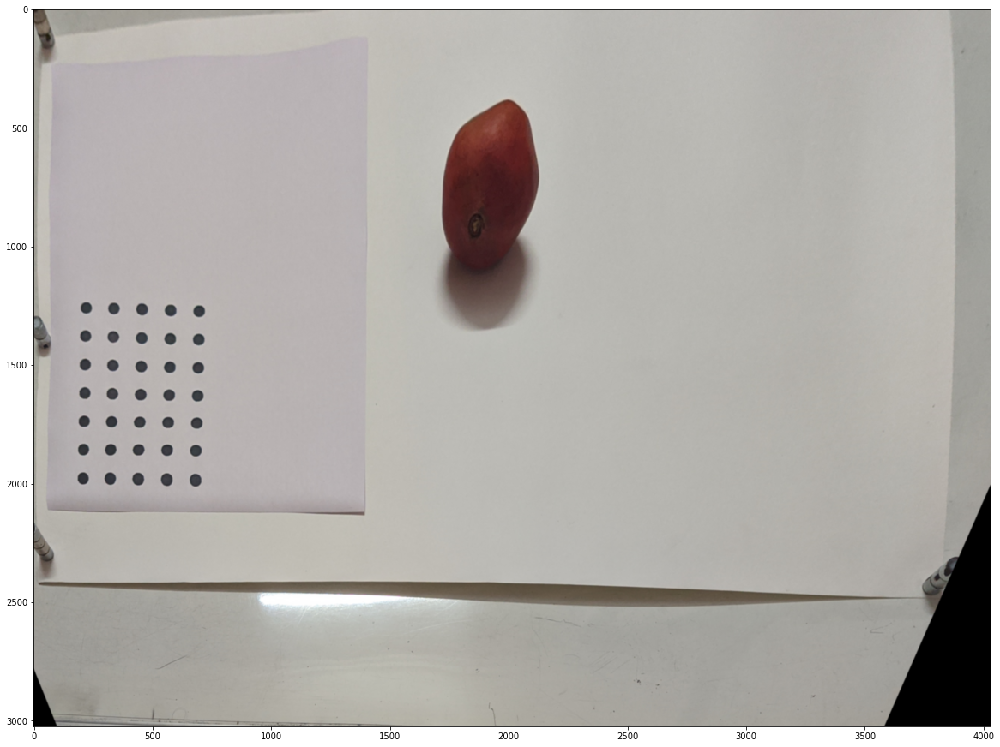

In [ ]:
img1_warp = cv2.warpPerspective(img1, H, (img1.shape[1], img1.shape[0]))

fig = plt.figure(figsize=(20,20))
plt.imshow(cv2.cvtColor(img1_warp, cv2.COLOR_BGR2RGB), interpolation='bicubic')


## Object detection

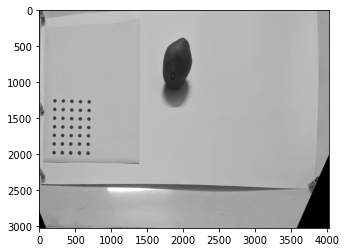

In [ ]:
gray = cv2.cvtColor(img1_warp, cv2.COLOR_BGR2GRAY)
plt.imshow(gray, "gray")


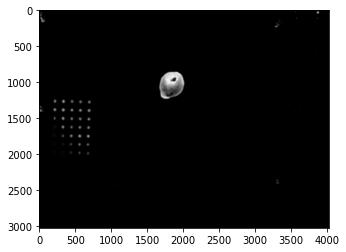

In [ ]:

blurred = cv2.GaussianBlur(gray, (31, 31), 0)
plt.imshow(blurred, "gray")


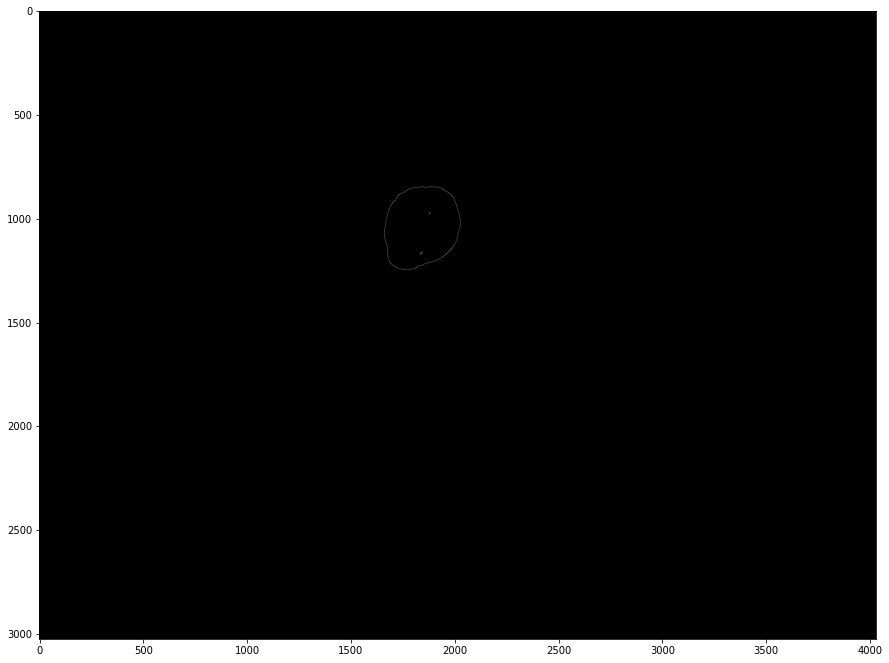

In [ ]:

edged = cv2.Canny(img2, 70, 100)
fig = plt.figure(figsize=(15, 15))
plt.imshow(edged, "gray")


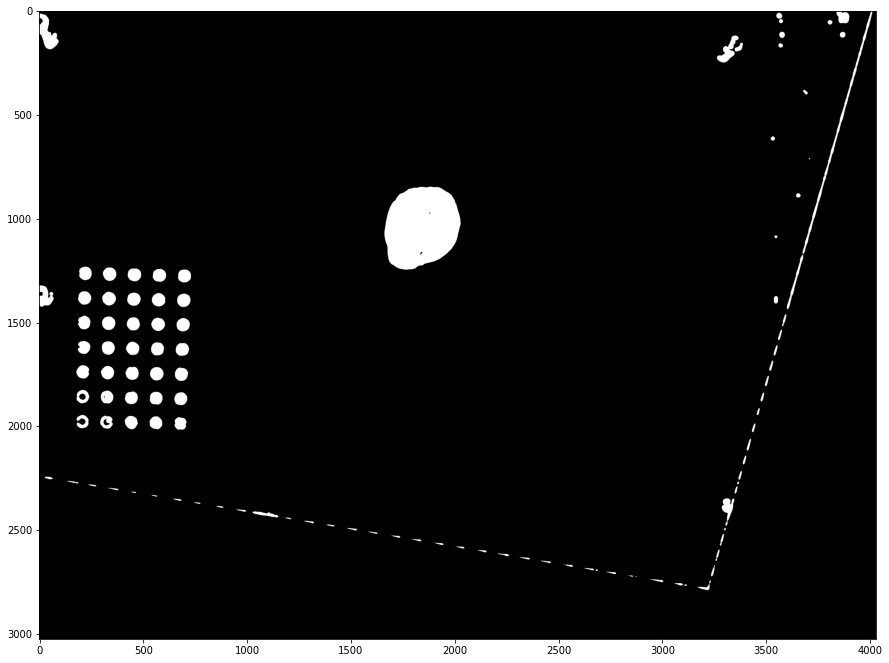

In [ ]:

thresh = cv2.threshold(blurred, 0, 255, cv2.THRESH_BINARY )[1]

plt.figure(figsize=(15, 15))

plt.imshow(thresh, "gray")
# display(2, 2, gray, blurred, edged, thresh)

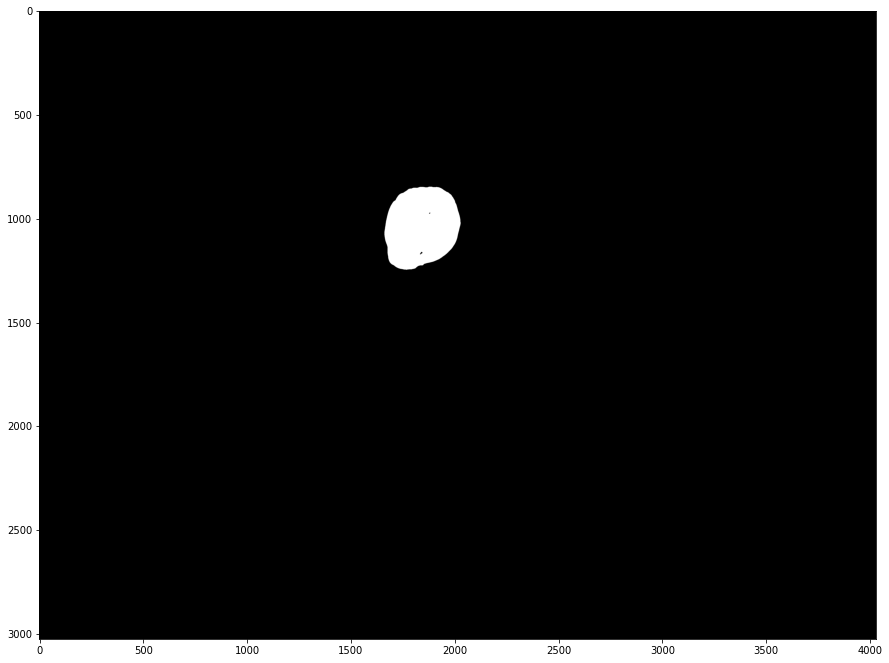

In [ ]:
#find all your connected components (white blobs in your image)
nb_components, output, stats, centroids = cv2.connectedComponentsWithStats(thresh, connectivity=8)
#connectedComponentswithStats yields every seperated component with information on each of them, such as size
#the following part is just taking out the background which is also considered a component, but most of the time we don't want that.
sizes = stats[1:, -1]; nb_components = nb_components - 1

# minimum size of particles we want to keep (number of pixels)
#here, it's a fixed value, but you can set it as you want, eg the mean of the sizes or whatever
min_size = 1e5
max_size = 1e6
#your answer image
img2 = np.zeros((output.shape), dtype=np.uint8)
#for every component in the image, you keep it only if it's above min_size
for i in range(0, nb_components):
    if sizes[i] >= min_size and sizes[i] <= max_size:
        img2[output == i + 1] = 255
plt.figure(figsize=(15,15))
plt.imshow(img2, "gray")
# gray = cv2.cvtColor(img2, cv2.COLOR_BGR2GRAY)

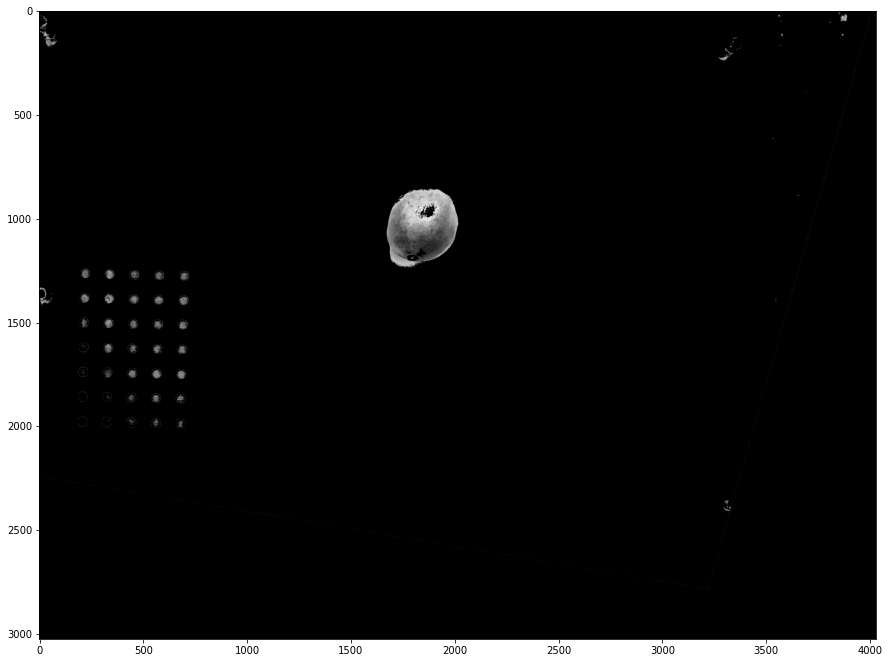

In [ ]:

# lower mask (0-10)
lower_red = np.array([0,0,20])
upper_red = np.array([50,50,150])
mask = cv2.inRange(img1_warp, lower_red, upper_red)

# set my output img to zero everywhere except my mask
output_img = img1_warp.copy()
output_img[np.where(mask==0)] = 0

plt.figure(figsize=(15, 15))

gray = cv2.cvtColor(output_img, cv2.COLOR_BGR2GRAY)
plt.imshow(gray, "gray")
# ret, thresh1 = cv2.threshold(gray, , 40, cv2.THRESH_BINARY)
# plt.imshow(thresh1, "gray")

In [ ]:
print(type(img2[0][0]))
print(type(thresh[0]))

<class 'numpy.float64'>
<class 'numpy.ndarray'>


6


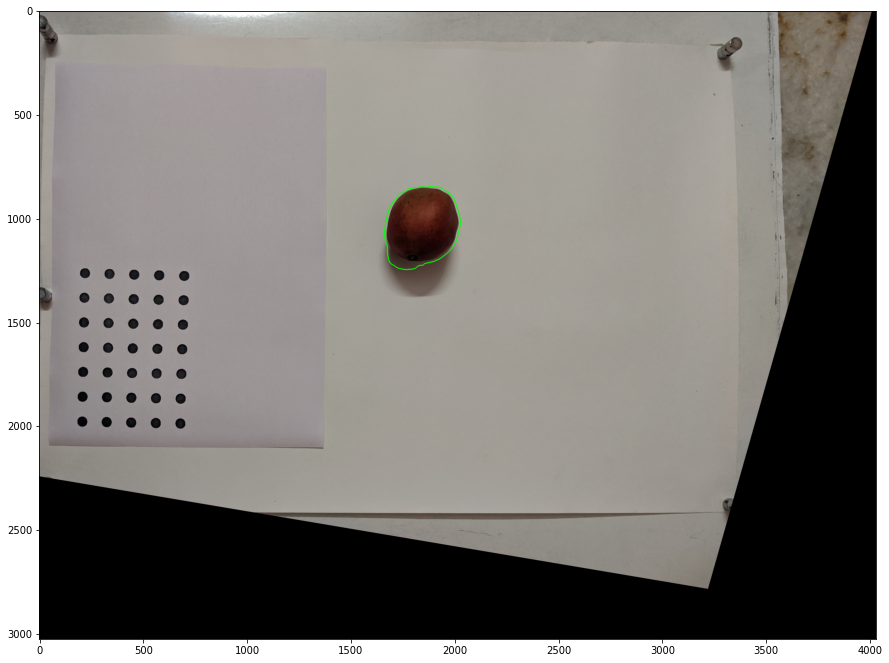

In [ ]:
import imutils
img1_warp_bgr = cv2.cvtColor(img1_warp, cv2.COLOR_BGR2RGB)
cnts = cv2.findContours(edged.copy(), cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
cnts = imutils.grab_contours(cnts)
cnts = sorted(cnts, key = cv2.contourArea, reverse = True)[:10]
print(len(cnts))
tomatoes = []
# loop over our contours
for c in cnts:
    (x, y, w, h) = cv2.boundingRect(c)
    ar = w / float(h)
	# in order to label the contour as a question, region
	# should be sufficiently wide, sufficiently tall, and
	# have an aspect ratio approximately equal to 1
    if w >= 20 and h >= 20 and ar >= 0.9 and ar <= 1.1:
        tomatoes.append(c)

temp_img = img1_warp_bgr.copy()
cv2.drawContours(temp_img, tomatoes, -1, (0, 255, 0), 3) 
plt.figure(figsize=(15, 15))
plt.imshow(temp_img)

In [ ]:
PX_to_MM = 100/475
# 475 px on reference image = 100 mm

radius(in px) = 183 .radius(in mm) = 38.526315789473685


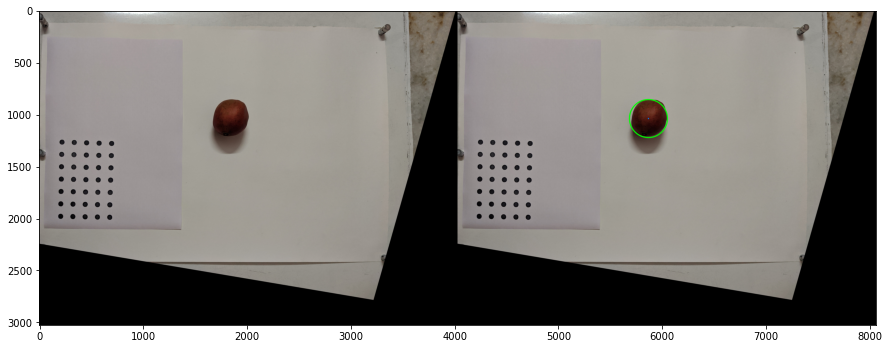

In [ ]:
# detect circles in the image
img1_warp_bgr = cv2.cvtColor(img1_warp, cv2.COLOR_BGR2RGB)
output = img1_warp_bgr.copy()
circles = cv2.HoughCircles(img2, cv2.HOUGH_GRADIENT, dp=6, minDist = 1000, minRadius=100, maxRadius=1000)
# print(circles)
# ensure at least some circles were found
if circles is not None:
    # convert the (x, y) coordinates and radius of the circles to integers
    circles = np.round(circles[0, :]).astype("int")
    # loop over the (x, y) coordinates and radius of the circles
    for (x, y, r) in circles:
        # draw the circle in the output image, then draw a rectangle
        # corresponding to the center of the circle
        cv2.circle(output, (x, y), r, (0, 255, 0), 10)
        cv2.rectangle(output, (x - 5, y - 5), (x + 5, y + 5), (0, 128, 255), -1)
	
        print("radius(in px) =", r, "radius(in mm) =", r * PX_to_MM)
    plt.figure(figsize=(15,15))
    plt.imshow(np.hstack([img1_warp_bgr, output]))
	# cv2.waitKey(0)

## Wrap everything

In [ ]:
def display(nr, nc, *args):
    fig, ax = plt.subplots(nr, nc, figsize=(10*nr,10*nc))

    for r in range(nr):
        for c in range(nc):
            ax[r][c].imshow(args[r*nc + c])


In [ ]:
class Homography():
    def __init__(self) :
        # Setup SimpleBlobDetector parameters.
        self.params = cv2.SimpleBlobDetector_Params()
        self.params.filterByArea = True
        self.params.minArea = 400
        self.params.maxArea = 6000
        self.params.minDistBetweenBlobs = 10
        self.params.filterByColor = True
        self.params.filterByConvexity = False
        self.params.minCircularity = 0.5
        self.params.filterByCircularity = True
        # Filter by Inertia
        self.params.filterByInertia = True
        # params.filterByInertia = False
        self.params.minInertiaRatio = 0.01

        # detector to find dots in pattern
        self.detector = cv2.SimpleBlobDetector_create(params)

    def getH(self, img, reference):
        keypoints = self.detector.detect(img)
        im_with_keypoints = cv2.drawKeypoints(img, keypoints, np.array([]), (0, 0, 255), cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

        keypoints_ref = self.detector.detect(reference)
        ref_with_keypoints = cv2.drawKeypoints(reference, keypoints_ref, np.array([]), (0, 0, 255), cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

        shape = (7, 5)
        ret1, corners1 = cv2.findCirclesGrid(img, shape, flags = cv2.CALIB_CB_SYMMETRIC_GRID + cv2.CALIB_CB_CLUSTERING, blobDetector=detector)
        ret2, corners2 = cv2.findCirclesGrid(reference, shape, flags = cv2.CALIB_CB_SYMMETRIC_GRID + cv2.CALIB_CB_CLUSTERING, blobDetector=detector)
        
        if ret1 != True:
            print("Could not find pattern in image")
            return
        elif ret2 != True:
            print("Could not find pattern in reference")
            return
        
        H, _ = cv2.findHomography(corners1, corners2)
        img_warp = self.warpImg(img, H)

        return img_warp, H
    
    def warpImg(self, img, H):
        return cv2.warpPerspective(img, H, (img.shape[1], img.shape[0]))



In [ ]:
import imutils

PX_to_MM = 100/475
# 475 px on reference image = 100 mm

# func to do all:
def Measure(inp_path, ref_path, rotate=False):
    img = cv2.imread(inp_path)
    if rotate:
        img = cv2.rotate(img, cv2.cv2.ROTATE_180_CLOCKWISE)
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    reference = cv2.imread(ref_path)   
    
    ## correct perseptive warp
    homography = Homography()
    img_warped, _ = homography.getH(img, reference)

    img_warped_rgb = cv2.cvtColor(img_warped, cv2.COLOR_BGR2RGB)
    ## find tomato

    #1. Color mask
    ###############
    lower_red = np.array([0,0,60])
    upper_red = np.array([50,70,180])
    mask = cv2.inRange(img_warped, lower_red, upper_red)

    # set output img to zero everywhere except mask
    output_img = img_warped.copy()
    output_img[np.where(mask==0)] = 0

    # gray scale to threshold and run edge detector
    gray = cv2.cvtColor(output_img, cv2.COLOR_BGR2GRAY)

    #2. Gaussian blur to get smoother boundaries
    ############################################
    blurred = cv2.GaussianBlur(gray, (31, 31), 0)

    #3. Threshold and make image binary
    ###################################
    thresh = cv2.threshold(blurred, 0, 255, cv2.THRESH_BINARY )[1]

    #4. Remove any patches not roughly the size of a fruit
    ######################################################
    #find all your connected components (white blobs in your image)
    nb_components, output, stats, centroids = cv2.connectedComponentsWithStats(thresh, connectivity=8)
    #connectedComponentswithStats yields every seperated component with information on each of them, such as size
    #the following part is just taking out the background which is also considered a component, but most of the time we don't want that.
    sizes = stats[1:, -1]; nb_components = nb_components - 1

    # minimum size of particles we want to keep (number of pixels)
    min_size = 5e4
    max_size = 1e6
    
    clean_img = np.zeros((output.shape), dtype=np.uint8)
    #for every component in the image, you keep it only if it's in range: above min size and below max size
    for i in range(0, nb_components):
        if sizes[i] >= min_size and sizes[i] <= max_size:
            clean_img[output == i + 1] = 255
    
    #5. Edge detector
    #################
    edged = cv2.Canny(clean_img, 70, 100)

    #6. Find and draw contours on image
    ###################################
    cnts = cv2.findContours(edged.copy(), cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
    cnts = imutils.grab_contours(cnts)
    cnts = sorted(cnts, key = cv2.contourArea, reverse = True)[:10]
    
    tomatoes = []
    # loop over our contours
    for c in cnts:
        (x, y, w, h) = cv2.boundingRect(c)
        ar = w / float(h)
        # in order to label the contour as a question, region
        # should be sufficiently wide, sufficiently tall, and
        # have an aspect ratio approximately equal to 1
        # if w >= 20 and h >= 20 and ar >= 0.9 and ar <= 1.1:
        tomatoes.append(c)

    if len(tomatoes) == 0:
        print("Could not find any tomaotes! try changing some of the parameters")

    temp1_img = img_warped_rgb.copy()
    cv2.drawContours(temp1_img, tomatoes, -1, (0, 255, 0), 3) 

    #7. Estimate size of excircle
    #############################
    temp2_img = img_warped_rgb.copy()
    # circles = cv2.HoughCircles(clean_img, cv2.HOUGH_GRADIENT, dp=2, minDist = 1000, minRadius=100, maxRadius=1000)
    Rs = []
    # if circles is None:
        # print("Could not find a excircle")
    # ensure at least some circles were found
    # if circles is not None:
        # convert the (x, y) coordinates and radius of the circles to integers
        # circles = np.round(circles[0, :]).astype("int")
        # loop over the (x, y) coordinates and radius of the circles
        # for (x, y, r) in circles:
            # draw the circle in the output image, then draw a rectangle
            # corresponding to the center of the circle
            # cv2.circle(temp2_img, (x, y), r, (0, 255, 0), 5)
            # cv2.rectangle(output, (x - 5, y - 5), (x + 5, y + 5), (0, 128, 255), -1)
        
            # print("radius(in px) =", r, "radius(in mm) =", r * PX_to_MM)
            # Rs.append(r*PX_to_MM)
    
    #7. Alternate: ellipses instead of circles
    ###########################
    color = [0,255,0]
    minRect = []
    minEllipse = []
    for i, c in enumerate(tomatoes):
        if c.shape[0] > 5:
            minRect.append(cv2.minAreaRect(c))
            minEllipse.append(cv2.fitEllipse(c))

            
    # sort according to minRect
    zippedLists = zip(minRect, minEllipse)
    zippedLists = sorted(zippedLists)
    minEllipse_sorted = [elem for _, elem in zippedLists]
    # draw ellipse on image
    if len(minEllipse) > 0:
        eli = minEllipse[0]
        cv2.ellipse(temp2_img, eli, color, 4)
        d1,d2 = eli[1]
        av_dia = sum(eli[1])/2
        print(f"d1, d2(in mm) = ({d1*PX_to_MM:0.2f}, {d2*PX_to_MM:0.2f}), radius(in px) = {av_dia}, radius(in mm) = {av_dia * PX_to_MM:0.2f}")
        Rs.append(av_dia*PX_to_MM)
    ## Done 
    return Rs, [img_rgb, img_warped_rgb, thresh, clean_img, temp1_img, temp2_img]
    



d1, d2(in mm) = (83.65, 167.33), radius(in px) = 596.0784759521484, radius(in mm) = 125.49


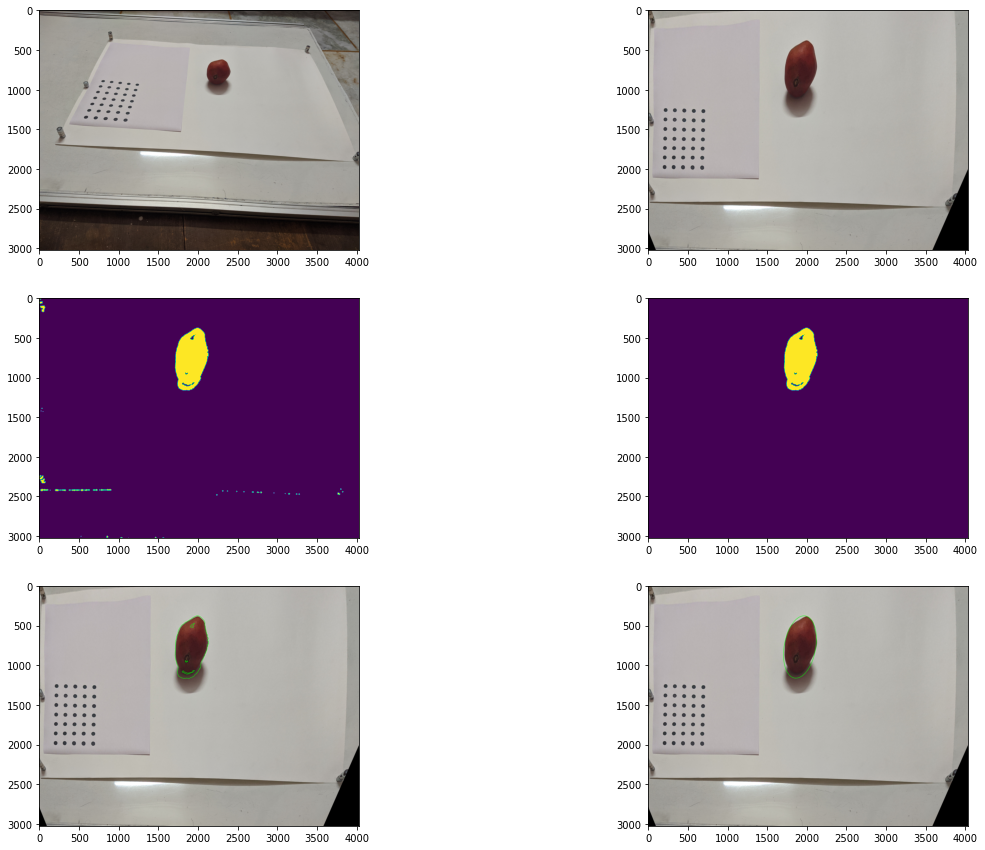

In [ ]:
## test:

Rs, imgs = Measure("sample9.jpg", "reference_flat.jpg")
display(3, 2, *imgs)

d1, d2(in mm) = (69.00, 104.06), radius(in px) = 411.019287109375, radius(in mm) = 86.53


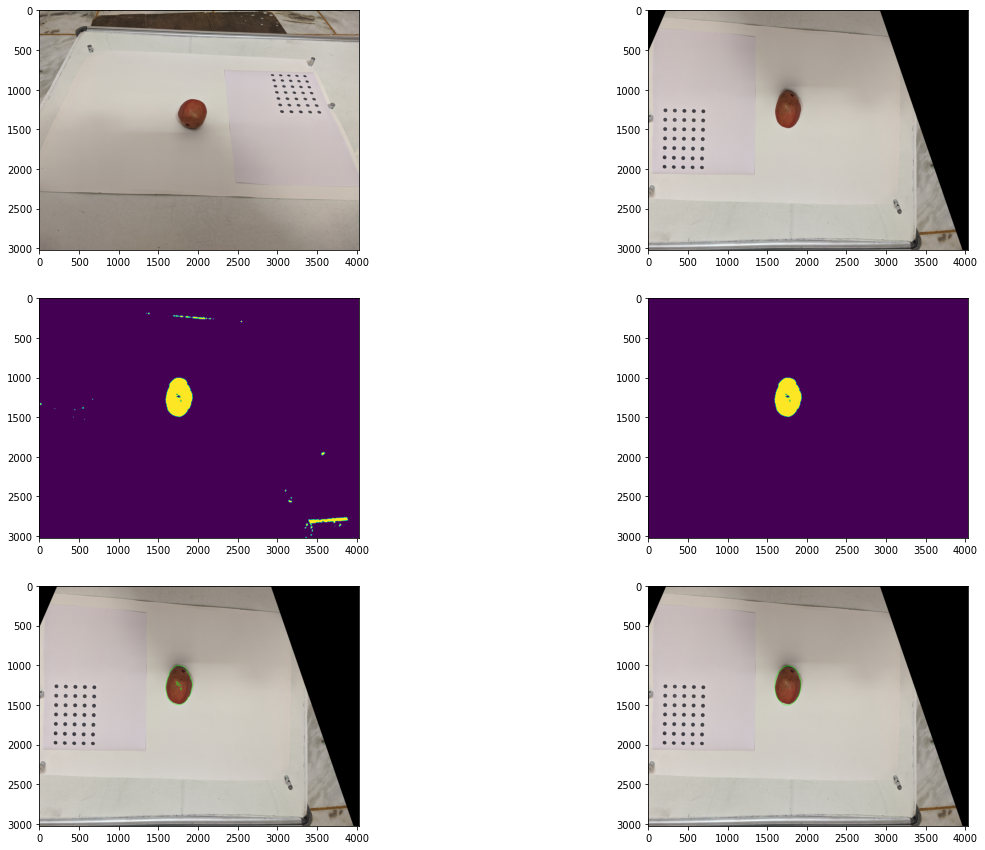

In [ ]:
## test:

Rs, imgs = Measure("sample10.jpg", "reference_flat.jpg")
display(3, 2, *imgs)

d1, d2(in mm) = (66.41, 73.63), radius(in px) = 332.6036376953125, radius(in mm) = 70.02


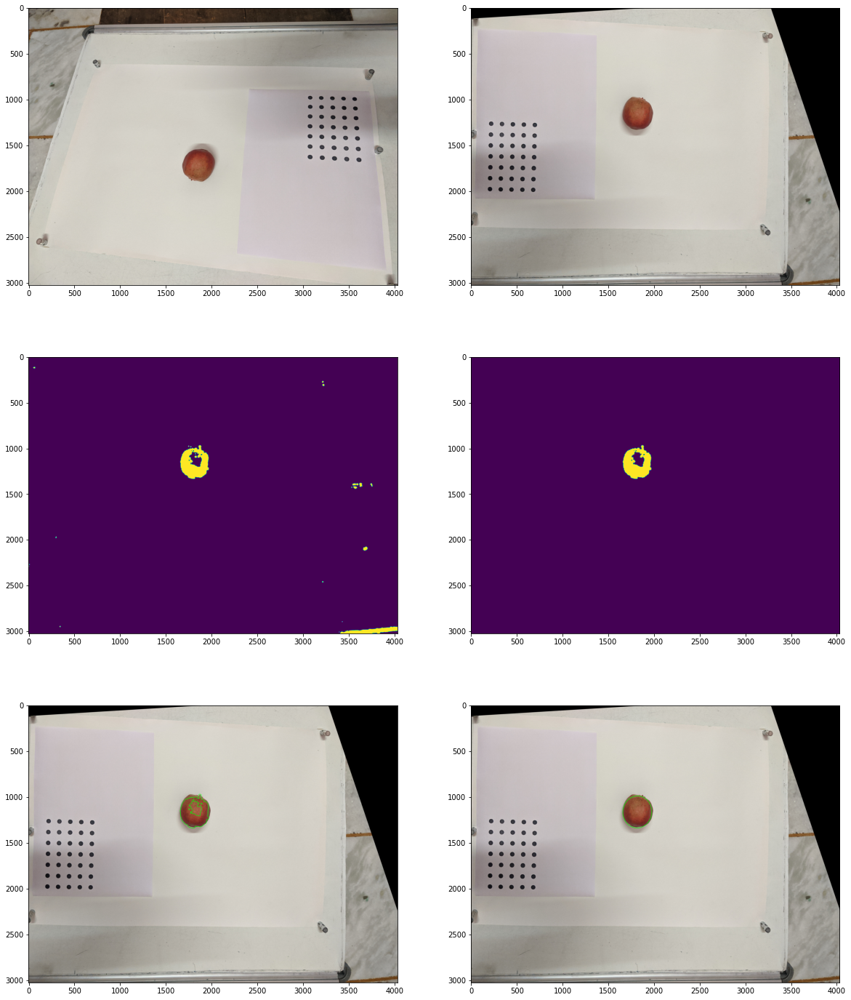

In [ ]:
Rs, imgs = Measure("sample11.jpg", "reference_flat.jpg")
display(3, 2, *imgs)

## Stereo Reconstruction

## Camera callibration

In [ ]:
import glob

In [ ]:
params = cv2.SimpleBlobDetector_Params()
# Setup SimpleBlobDetector parameters.
print('params')
print(params)
print(type(params))

params.filterByArea = True
params.minArea = 500
params.maxArea = 6000
params.minDistBetweenBlobs = 15
params.filterByColor = True
params.filterByConvexity = False
params.minCircularity = 0.4
params.filterByCircularity = True
# Filter by Inertia
params.filterByInertia = True
# params.filterByInertia = False
params.minInertiaRatio = 0.01

detector = cv2.SimpleBlobDetector_create(params)


params
<SimpleBlobDetector_Params 0x7ff597bb9bd0>
<class 'cv2.SimpleBlobDetector_Params'>


In [ ]:
shape = (7, 5)
# list of known 3d points used as a reference
objp = np.zeros((7*5, 3), dtype=np.float32)
objp[:,:2] = np.mgrid[0:7,0:5].T.reshape(-1,2)
# Arrays to store object points and image points from all the images.
objpoints = [] # 3d point in real world space
imgpoints = [] # 2d points in image plane.

images = glob.glob("calibration*.jpg")
for fname in images:
  img = cv2.imread(fname)
  gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

  ret, corners = cv2.findCirclesGrid(gray, shape, flags = cv2.CALIB_CB_SYMMETRIC_GRID + cv2.CALIB_CB_CLUSTERING, blobDetector=detector)
  if ret == True:
    objpoints.append(objp)
    imgpoints.append(corners)
    print(f"added points from image:{fname}")


added points from image:calibration_3.jpg
added points from image:calibration_8.jpg
added points from image:calibration_1.jpg
added points from image:calibration_5.jpg
added points from image:calibration_4.jpg
added points from image:calibration_0.jpg
added points from image:calibration_6.jpg
added points from image:calibration_7.jpg
added points from image:calibration_2.jpg


In [ ]:
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, gray.shape[::-1], None, None)
# print("ret", ret)
print("camera matrix from callibration\n", mtx)
print("distortion coeffs", dist[0])
# print("extrinsic params\n", rvecs, tvecs)

camera matrix from callibration
 [[3.09780121e+03 0.00000000e+00 1.52093983e+03]
 [0.00000000e+00 3.07872932e+03 2.01415026e+03]
 [0.00000000e+00 0.00000000e+00 1.00000000e+00]]
distortion coeffs [ 0.41258707 -1.29798744 -0.00505343 -0.0105071   1.15977581]


## Intrinsic camera parameters

In [ ]:
f = 4.2e-3 # 4.2 mm
dx = dy = 1.4e-6  #1.4µm
x0 = 2016
y0 = 1512
K = np.mat([[f/dx, 0,    x0],
            [0,    f/dy, y0], 
            [0,    0,    1 ]])

dist = np.array([0,0,0,0,0])
print(f"estimated camera matrix\n", K)

estimated camera matrix
 [[3.000e+03 0.000e+00 2.016e+03]
 [0.000e+00 3.000e+03 1.512e+03]
 [0.000e+00 0.000e+00 1.000e+00]]



## Estimate camera R and T matrices

In [ ]:
img1 = cv2.imread("tomato1.jpg")
gray1 = cv2.cvtColor(img1, cv2.COLOR_BGR2GRAY)
img2 = cv2.imread("tomato3.jpg")
gray2 = cv2.cvtColor(img2, cv2.COLOR_BGR2GRAY)

ret1, corners1 = cv2.findCirclesGrid(gray1, shape, flags = cv2.CALIB_CB_SYMMETRIC_GRID + cv2.CALIB_CB_CLUSTERING, blobDetector=detector)
ret2, corners2 = cv2.findCirclesGrid(gray2, shape, flags = cv2.CALIB_CB_SYMMETRIC_GRID + cv2.CALIB_CB_CLUSTERING, blobDetector=detector)

print(ret1, ret2)

## R and T using solvepnp
if ret1 == True and ret2 == True:
  ret, rvec1, tvec1 = cv2.solvePnP(objp, corners1, mtx, dist)
  ret, rvec2, tvec2 = cv2.solvePnP(objp, corners2, mtx, dist)
  print("rvec1\n", rvec1)
  print("tvec1\n", tvec1)
  print("rvec2\n", rvec2)
  print("tvec2\n", tvec2)

  print("============================================================")
  print("translation and rotatation between the two camera positions:")
  R_vec, T_vec = rvec2 - rvec1, tvec2 - tvec1
  print("Translation:\n", R_vec)
  print("Rotation:\n", T_vec)


True True
rvec1
 [[-0.48998206]
 [ 0.69530877]
 [ 1.84152593]]
tvec1
 [[-4.9043176 ]
 [ 2.28511328]
 [30.19088235]]
rvec2
 [[-0.38566618]
 [ 0.47589131]
 [ 1.94861546]]
tvec2
 [[-10.7697389 ]
 [  2.17786069]
 [ 37.3419783 ]]
translation and rotatation between the two camera positions:
Translation:
 [[ 0.10431589]
 [-0.21941746]
 [ 0.10708952]]
Rotation:
 [[-5.8654213 ]
 [-0.10725259]
 [ 7.15109595]]


### Get rectification matrices

In [ ]:
R1, R2, P1, P2, Q, _, _ = cv2.stereoRectify(mtx, dist, mtx, dist, (4032, 3024), R_vec, T_vec, alpha=0)
print(P1)
print(P2)

[[ 8.29508573e+04  0.00000000e+00 -1.88838269e+04  0.00000000e+00]
 [ 0.00000000e+00  8.29508573e+04  1.99252267e+04  0.00000000e+00]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00  0.00000000e+00]]
[[ 8.29508573e+04  0.00000000e+00 -1.88838269e+04  5.71796673e+05]
 [ 0.00000000e+00  8.29508573e+04  1.99252267e+04  0.00000000e+00]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00  0.00000000e+00]]


## Rectify images

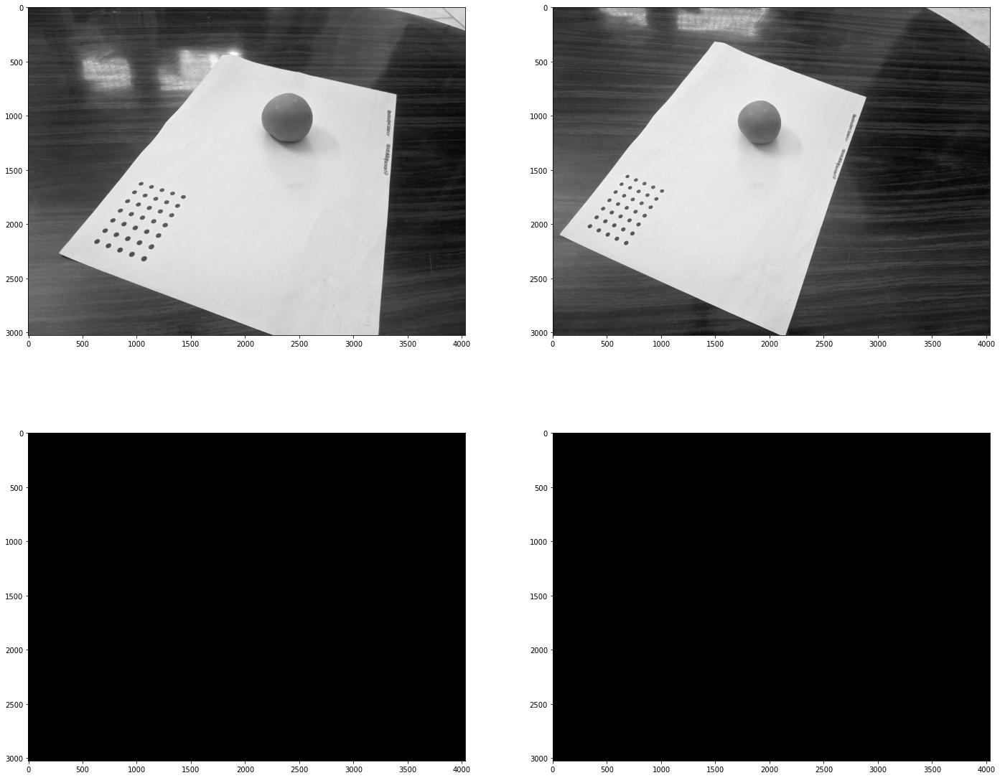

In [ ]:
# gray1_rect = cv2.undistortPoints(src=gray1, cameraMatrix=mtx, distCoeffs=dist, R = R1, P = P1)
map1_x, map1_y = cv2.initUndistortRectifyMap(mtx, dist, R1, P1, (4032,3024), cv2.CV_32FC1)
map2_x, map2_y = cv2.initUndistortRectifyMap(mtx, dist, R2, P2, (4032,3024), cv2.CV_32FC1)

gray1_U = cv2.remap(gray1, map1_x, map1_y, interpolation=cv2.INTER_LINEAR)
gray2_U = cv2.remap(gray2, map2_x, map2_y, interpolation=cv2.INTER_LINEAR)

fix, ax = plt.subplots(2, 2, figsize=(24, 20))
ax[0][0].imshow(gray1, "gray")
ax[0][1].imshow(gray2, "gray")
ax[1][0].imshow(gray1_U, "gray")
ax[1][1].imshow(gray2_U, "gray")

## Try with stereo calibrate instead


In [ ]:
shape = (7, 5)
# list of known 3d points used as a reference
objp = np.zeros((7*5, 3), dtype=np.float32)
objp[:,:2] = np.mgrid[0:7,0:5].T.reshape(-1,2)
# Arrays to store object points and image points from all the images.
objpoints = [] # 3d point in real world space
imgpoints = [] # 2d points in image plane.

ret1, corners1 = cv2.findCirclesGrid(gray1, shape, flags = cv2.CALIB_CB_SYMMETRIC_GRID + cv2.CALIB_CB_CLUSTERING, blobDetector=detector)
ret2, corners2 = cv2.findCirclesGrid(gray2, shape, flags = cv2.CALIB_CB_SYMMETRIC_GRID + cv2.CALIB_CB_CLUSTERING, blobDetector=detector)
print(ret1, ret2)
objpoints.append(objp)
imgpoints.append(corners)

stereocalibration_criteria = (cv2.TERM_CRITERIA_MAX_ITER + cv2.TERM_CRITERIA_EPS, 100, 1e-5)
stereocalibration_flags = cv2.CALIB_FIX_INTRINSIC
stereocalibration_retval, cameraMatrix1, distCoeffs1, cameraMatrix2, distCoeffs2, R, T, E, F = cv2.stereoCalibrate(
    objpoints, 
    [corners1],
    [corners2],
    mtx,
    dist,
    mtx,
    dist,
    gray1.shape[::-1],
    criteria = stereocalibration_criteria, 
    flags = stereocalibration_flags
)


print("Camera matrices:\n", cameraMatrix1, "\n", cameraMatrix2)
print("============================================================")
print("translation and rotatation between the two camera positions:")
print("Translation:\n", T)
print("Rotation:\n", R)
print("Fundamental Matrix:\n", F)

True True
Camera matrices:
 [[3.09780121e+03 0.00000000e+00 1.52093983e+03]
 [0.00000000e+00 3.07872932e+03 2.01415026e+03]
 [0.00000000e+00 0.00000000e+00 1.00000000e+00]] 
 [[3.09780121e+03 0.00000000e+00 1.52093983e+03]
 [0.00000000e+00 3.07872932e+03 2.01415026e+03]
 [0.00000000e+00 0.00000000e+00 1.00000000e+00]]
translation and rotatation between the two camera positions:
Translation:
 [[-4.17866387]
 [-1.01158653]
 [-0.97808613]]
Rotation:
 [[ 0.97428824  0.02656397 -0.22373371]
 [-0.00505019  0.99535054  0.09618629]
 [ 0.22524856 -0.09258328  0.96989248]]
Fundamental Matrix:
 [[ 3.61035001e-08 -1.66531284e-07  7.06667758e-04]
 [ 1.82570730e-09  6.48235965e-08 -2.19826989e-03]
 [-5.42220631e-04  2.12030015e-03  1.00000000e+00]]


### Epi lines in the original images:


In [ ]:
def drawlines(img1,img2,lines,pts1,pts2, colors=None):
    ''' img1 - image on which we draw the epilines for the points in img2
        lines - corresponding epilines '''
    r,c = img1.shape
    img1 = cv2.cvtColor(img1,cv2.COLOR_GRAY2BGR)
    img2 = cv2.cvtColor(img2,cv2.COLOR_GRAY2BGR)
    if colors is None:
      colors = [tuple(np.random.randint(0,255,3).tolist())*len(corners1)]
    for r,pt1,pt2,color in zip(lines,pts1,pts2,colors):
        # print(tuple(*pt1))
        # color = tuple(np.random.randint(0,255,3).tolist())
        x0,y0 = map(int, [0, -r[2]/r[1] ])
        x1,y1 = map(int, [c, -(r[2]+r[0]*c)/r[1] ])
        img1 = cv2.line(img1, (x0,y0), (x1,y1), color, 2)
        img1 = cv2.circle(img1,tuple(*pt1),20,color,-1)
        img2 = cv2.circle(img2,tuple(*pt2),20,color,-1)
    return img1,img2

(248, 57, 53)


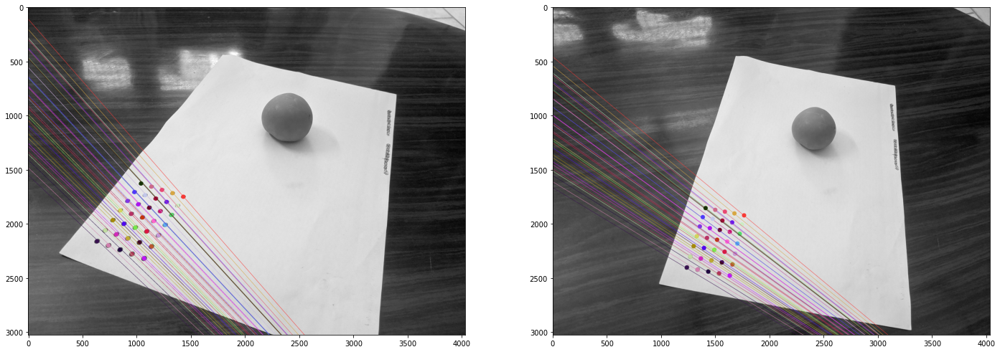

In [ ]:
colors = [tuple(np.random.randint(0,255,3).tolist()) for i in range(len(corners1))]
print(colors[0])
# Find epilines corresponding to points in right image (second image) and
# drawing its lines on left image
lines1 = cv2.computeCorrespondEpilines(corners2.reshape(-1,1,2), 2, F)
lines1 = lines1.reshape(-1,3)
img5,img6 = drawlines(gray1,gray2,lines1,corners1,corners2,colors)
# Find epilines corresponding to points in left image (first image) and
# drawing its lines on right image
lines2 = cv2.computeCorrespondEpilines(corners1.reshape(-1,1,2), 1, F)
lines2 = lines2.reshape(-1,3)
img3,img4 = drawlines(gray2, gray1, lines2, corners2, corners1, colors)

fig, ax = plt.subplots(1,2,figsize=(24,20))
ax[0].imshow(img5)
ax[1].imshow(img3)
# plt.show()

In [ ]:
print(cameraMatrix1)
print(cameraMatrix2)
print(T)
R1, R2, P1, P2, Q, _, _ = cv2.stereoRectify(cameraMatrix1, distCoeffs1, cameraMatrix2, distCoeffs2, (4032, 3024), R, T, alpha=-1)
# print(R1)
# print(P1)
# print(T)
# P1[0][3] = T[0][0]
# # P1[1][3] = -T[1][0]
# print(P1)

map1_x, map1_y = cv2.initUndistortRectifyMap(cameraMatrix1, distCoeffs1, R1, P1, (4032,3024), cv2.CV_32FC1)
map2_x, map2_y = cv2.initUndistortRectifyMap(cameraMatrix2, distCoeffs2, R2, P2, (4032,3024), cv2.CV_32FC1)
  
gray1_U = cv2.remap(gray1, map1_x, map1_y, interpolation=cv2.INTER_LINEAR)
gray2_U = cv2.remap(gray2, map2_x, map2_y, interpolation=cv2.INTER_LINEAR)


[[3.22449253e+03 0.00000000e+00 1.96287885e+03]
 [0.00000000e+00 3.23176728e+03 1.49836022e+03]
 [0.00000000e+00 0.00000000e+00 1.00000000e+00]]
[[3.22449253e+03 0.00000000e+00 1.96287885e+03]
 [0.00000000e+00 3.23176728e+03 1.49836022e+03]
 [0.00000000e+00 0.00000000e+00 1.00000000e+00]]
[[7.16284517]
 [7.20515938]
 [6.96448676]]


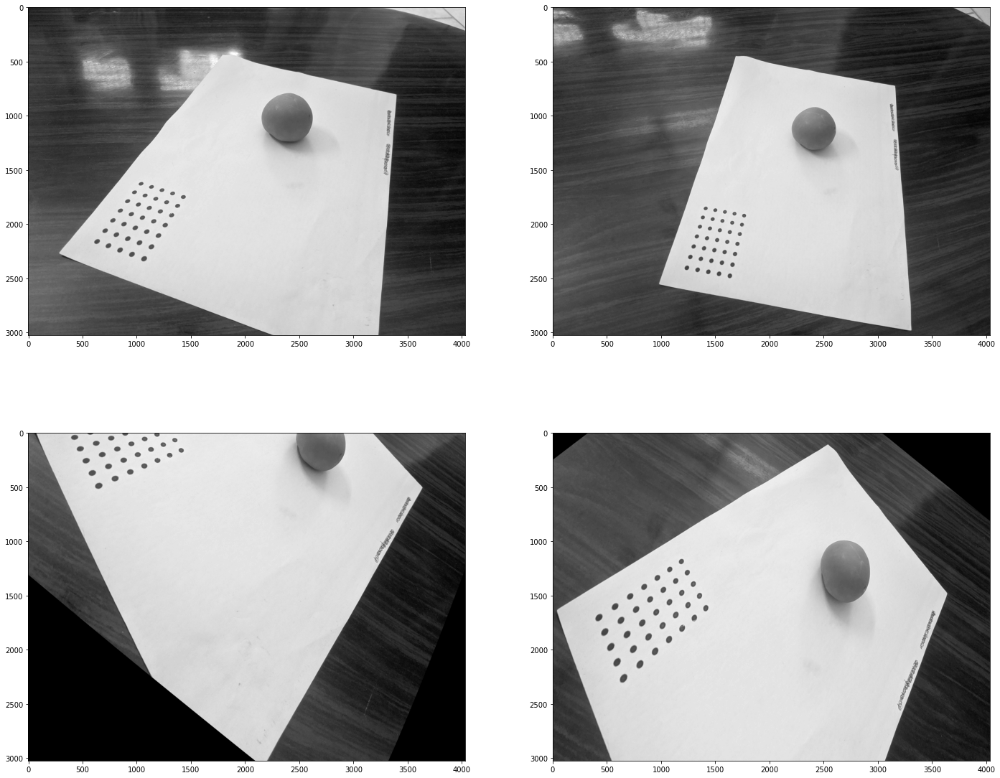

In [ ]:
fig, ax = plt.subplots(2, 2, figsize=(24, 20))
ax[0][0].imshow(gray1, "gray")
ax[0][1].imshow(gray2, "gray")
ax[1][0].imshow(gray1_U, "gray")
ax[1][1].imshow(gray2_U, "gray")

# fig, ax = plt.subplots(1, 1, figsize=(12, 10))
# ax.imshow(gray1_U + gray2_U / 2, "gray")

In [ ]:
ret1, corners1 = cv2.findCirclesGrid(gray1_U, shape, flags = cv2.CALIB_CB_SYMMETRIC_GRID + cv2.CALIB_CB_CLUSTERING, blobDetector=detector)
ret2, corners2 = cv2.findCirclesGrid(gray2_U, shape, flags = cv2.CALIB_CB_SYMMETRIC_GRID + cv2.CALIB_CB_CLUSTERING, blobDetector=detector)

#try aligning:
y_diff = 0.
for pt1, pt2 in zip(corners1, corners2):
  y_diff += pt2[0][1] - pt1[0][1]
y_diff /= len(corners1)
print(y_diff)
warp_mat = np.mat([[1, 0, 0,],
                   [0, 1, y_diff]])

imgL = cv2.warpAffine(gray1_U, warp_mat, (gray1_U.shape[1], gray1_U.shape[0]))
imgR = gray2_U.copy()

ret1, corners1 = cv2.findCirclesGrid(imgL, shape, flags = cv2.CALIB_CB_SYMMETRIC_GRID + cv2.CALIB_CB_CLUSTERING, blobDetector=detector)
ret2, corners2 = cv2.findCirclesGrid(imgR, shape, flags = cv2.CALIB_CB_SYMMETRIC_GRID + cv2.CALIB_CB_CLUSTERING, blobDetector=detector)
print(len(corners1), len(corners2))

# F would have changed(not sure)
stereocalibration_criteria = (cv2.TERM_CRITERIA_MAX_ITER + cv2.TERM_CRITERIA_EPS, 100, 1e-5)
stereocalibration_flags = cv2.CALIB_FIX_INTRINSIC
stereocalibration_retval, cameraMatrix1_U, distCoeffs1_U, cameraMatrix2_U, distCoeffs2_U, R, T, E, F = cv2.stereoCalibrate(
    [objp],
    [corners1],
    [corners2],
    mtx,
    dist,
    mtx,
    dist,
    imgL.shape[::-1],
    criteria = stereocalibration_criteria, )
print("fundamental matrix:\n", F)

lines1 = cv2.computeCorrespondEpilines(corners2.reshape(-1,1,2), 2, F)
lines1 = lines1.reshape(-1,3)
img5,img6 = drawlines(imgL,imgR,lines1,corners1,corners2,colors)
# Find epilines corresponding to points in left image (first image) and
# drawing its lines on right image
lines2 = cv2.computeCorrespondEpilines(corners1 .reshape(-1,1,2), 1, F)
lines2 = lines2.reshape(-1,3)
img3,img4 = drawlines(imgR, imgL, lines2, corners2, corners1, colors)

fig, ax = plt.subplots(1,2,figsize=(24,20))
ax[0].imshow(img5)
ax[1].imshow(img3)

TypeError: ignored

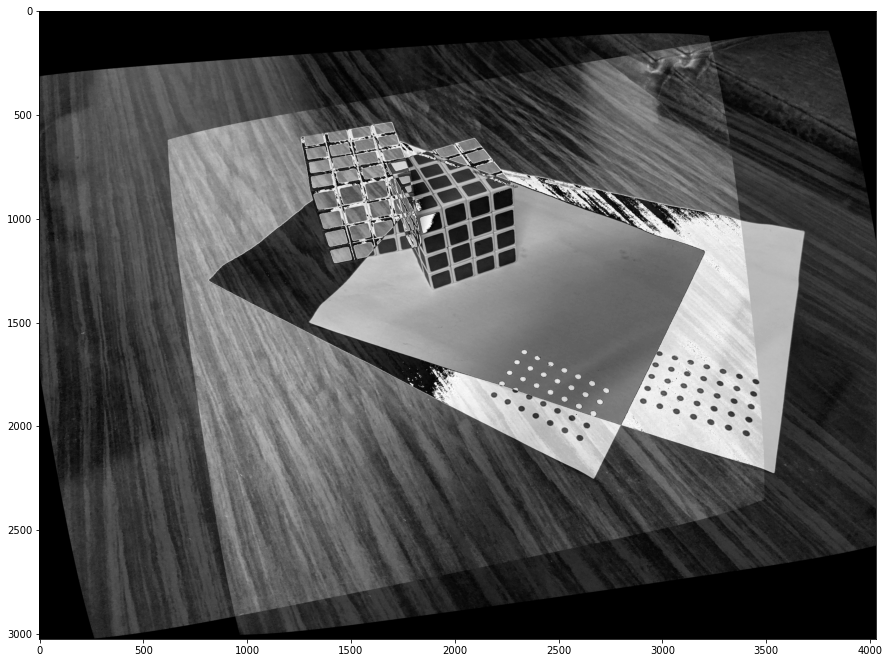

In [ ]:
plt.figure(figsize=(15,15))
plt.imshow((gray1_U + gray2_U)/2, "gray")

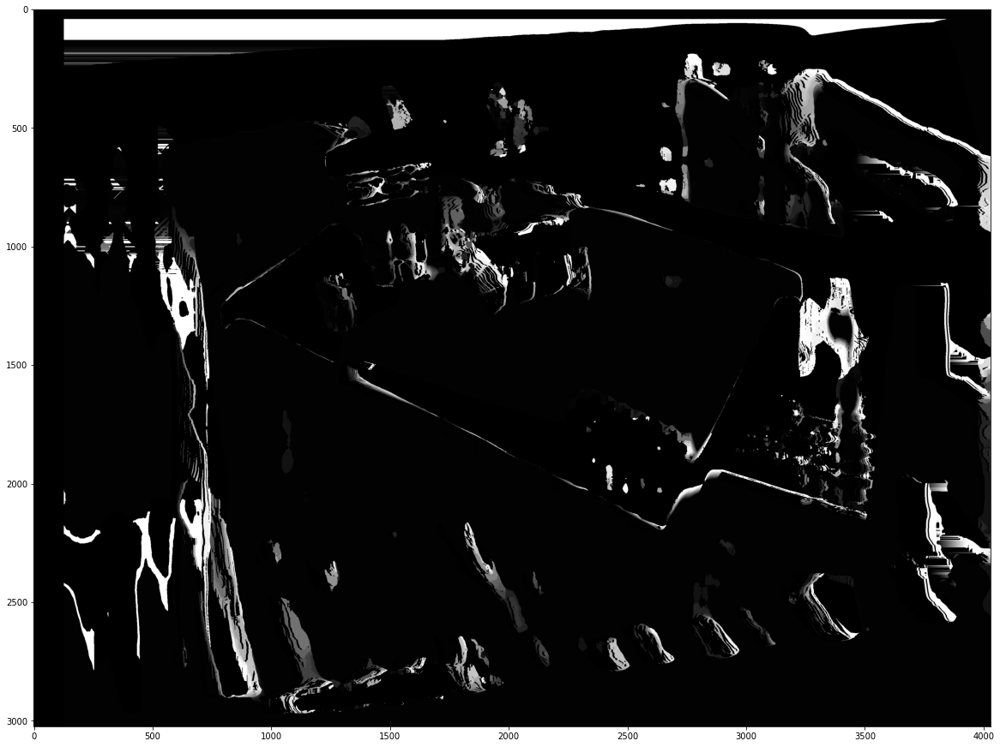

In [ ]:
### get disparity and depth
stereo = cv2.StereoSGBM_create(
            minDisparity = 0,
            numDisparities= , 
            blockSize=101,
            speckleRange=2
        )
disparity = stereo.compute(gray1_U, gray2_U)

plt.figure(figsize=(20,20))
plt.imshow(disparity,'gray')

In [ ]:
ret1, corners1 = cv2.findCirclesGrid(gray1_U, shape, flags = cv2.CALIB_CB_SYMMETRIC_GRID + cv2.CALIB_CB_CLUSTERING, blobDetector=detector)
ret2, corners2 = cv2.findCirclesGrid(gray2_U, shape, flags = cv2.CALIB_CB_SYMMETRIC_GRID + cv2.CALIB_CB_CLUSTERING, blobDetector=detector)

#try aligning:
y_diff = 0.
for pt1, pt2 in zip(corners1, corners2):
  y_diff += pt2[0][1] - pt1[0][1]
y_diff /= len(corners1)
# imgL = cv2.warpAffine(gray1, warp_mat, (gray1_U.shape[1], gray1_U.shape[0]))
# imgR = gray2.copy()
print(y_diff)
print(len(corners1))
print(len(corners2))
# F would have changed(not sure)
stereocalibration_criteria = (cv2.TERM_CRITERIA_MAX_ITER + cv2.TERM_CRITERIA_EPS, 100, 1e-5)
stereocalibration_flags = cv2.CALIB_FIX_INTRINSIC
stereocalibration_retval, cameraMatrix1_U, distCoeffs1_U, cameraMatrix2_U, distCoeffs2_U, R, T, E, F = cv2.stereoCalibrate(
    objpoints, 
    [corners1],
    [corners2],
    cameraMatrix1,
    distCoeffs1,
    cameraMatrix2,
    distCoeffs2,
    gray1_U.shape[::-1],
    criteria = stereocalibration_criteria, 
    flags = stereocalibration_flags)
print("fundamental matrix:\n", F)

lines1 = cv2.computeCorrespondEpilines(corners2.reshape(-1,1,2), 2, F)
lines1 = lines1.reshape(-1,3)
img5,img6 = drawlines(gray1_U,gray2_U,lines1,corners1,corners2,colors)
# Find epilines corresponding to points in left image (first image) and
# drawing its lines on right image
lines2 = cv2.computeCorrespondEpilines(corners1 .reshape(-1,1,2), 1, F)
lines2 = lines2.reshape(-1,3)
img3,img4 = drawlines(gray2_U, gray1_U, lines2, corners2, corners1, colors)

fig, ax = plt.subplots(1,2,figsize=(24,20))
ax[0].imshow(img5)
ax[1].imshow(img3)

NameError: ignored

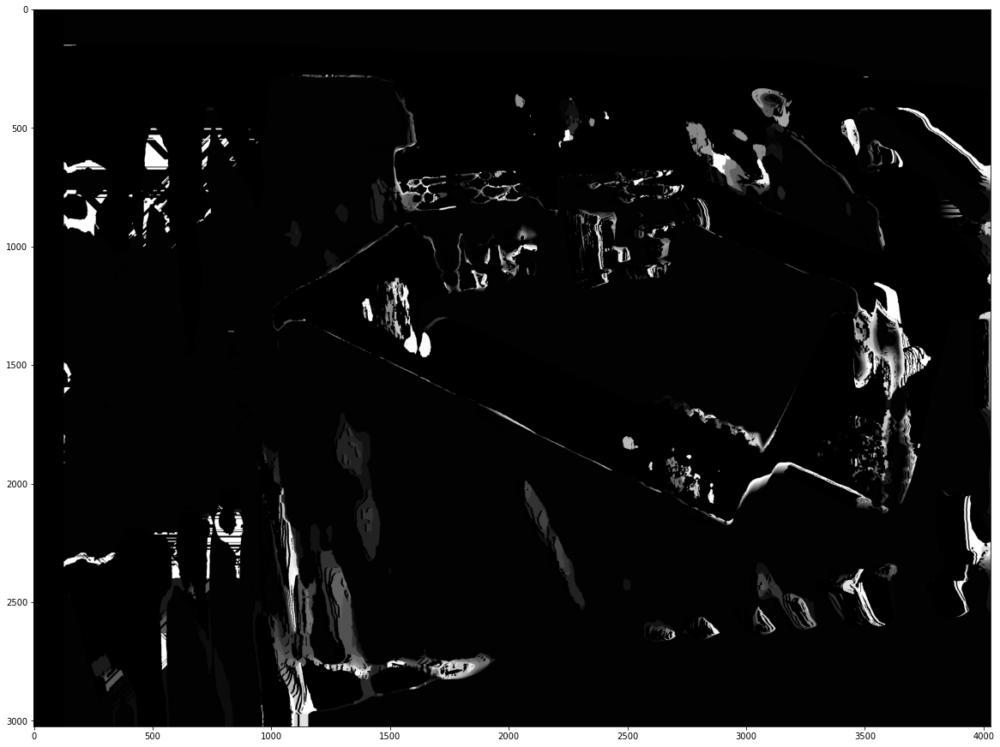

In [ ]:
### get disparity and depth
stereo = cv2.StereoSGBM_create(
            minDisparity = 0,
            numDisparities= 128, 
            blockSize=101,
            speckleRange=10
        )
disparity = stereo.compute(gray1_U, gray2_U)

plt.figure(figsize=(20,20))
plt.imshow(disparity,'gray')

## Stereo Rectification uncalibrated

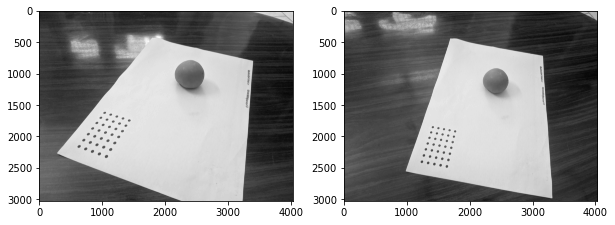

In [ ]:
fig, ax = plt.subplots(1,2,figsize=(10,10))
ax[0].imshow(gray1, "gray")
ax[1].imshow(gray2, "gray")

In [ ]:
ret, H1, H2 = cv2.stereoRectifyUncalibrated(corners1, corners2, F, (4032, 3024)) 

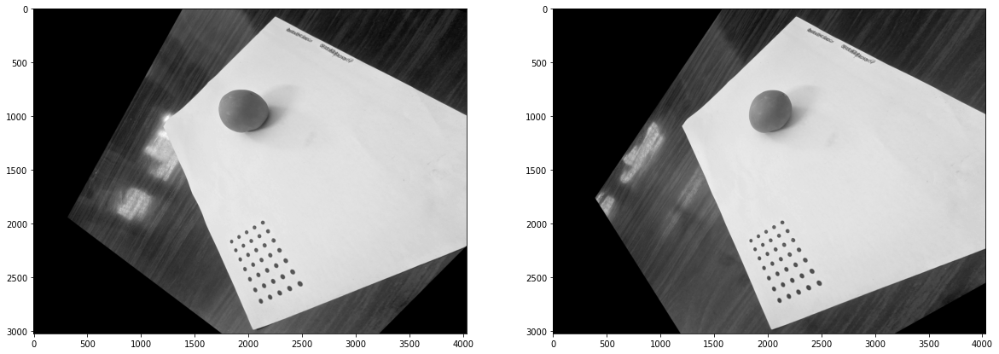

In [ ]:
gray1_warp = cv2.warpPerspective(gray1, H1, (gray1.shape[1], gray1.shape[0]))
gray2_warp = cv2.warpPerspective(gray2, H2, (gray2.shape[1], gray2.shape[0]))
fig, ax = plt.subplots(1,2,figsize=(20,20))
ax[0].imshow(gray1_warp, "gray")
ax[1].imshow(gray2_warp, "gray")

In [ ]:
# epilines in the rectified images
# ret1, corners1 = cv2.findCirclesGrid(gray1_warp, shape, flags = cv2.CALIB_CB_SYMMETRIC_GRID + cv2.CALIB_CB_CLUSTERING, blobDetector=detector)
# ret2, corners2 = cv2.findCirclesGrid(gray2_warp, shape, flags = cv2.CALIB_CB_SYMMETRIC_GRID + cv2.CALIB_CB_CLUSTERING, blobDetector=detector)

colors = [tuple(np.random.randint(0,255,3).tolist()) for i in range(len(corners1))]
print(colors[0])
# Find epilines corresponding to points in right image (second image) and
# drawing its lines on left image
lines1 = cv2.computeCorrespondEpilines(corners2.reshape(-1,1,2), 2, F)
lines1 = lines1.reshape(-1,3)
img5,img6 = drawlines(gray1_warp,gray2_warp,lines1,corners1,corners2,colors)
# Find epilines corresponding to points in left image (first image) and
# drawing its lines on right image
lines2 = cv2.computeCorrespondEpilines(corners1.reshape(-1,1,2), 1, F)
lines2 = lines2.reshape(-1,3)
img3,img4 = drawlines(gray2_warp, gray1_warp, lines2, corners2, corners1, colors)

fig, ax = plt.subplots(1,2,figsize=(24,20))
ax[0].imshow(img5)
ax[1].imshow(img3)
# plt.show()

(175, 229, 221)


NameError: ignored

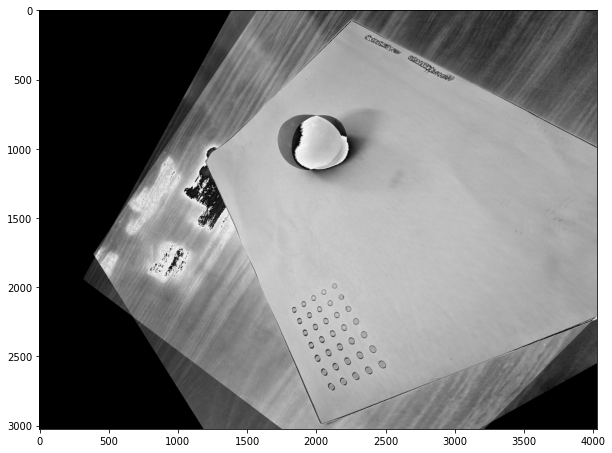

In [ ]:
plt.figure(figsize=(10,10))
plt.imshow((gray1_warp + gray2_warp) / 2, "gray")

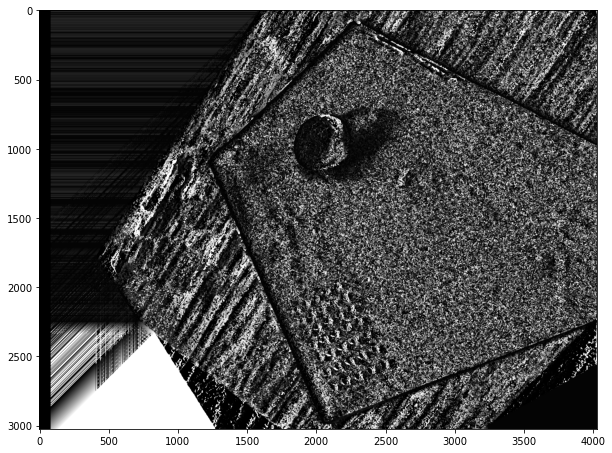

In [ ]:
### get disparity and depth
stereo = cv2.StereoSGBM_create(
            minDisparity = 20,
            numDisparities= 64, 
            blockSize=11,
            speckleRange=2
        )
# stereo = cv2.StereoBM_create(numDisparities = 128, blockSize=11)

# blur1 = cv2.GaussianBlur(gray1_warp, (51, 51), 0)
# blur2 = cv2.GaussianBlur(gray2_warp, (51, 51), 0)
# plt.imshow(blurred, "gray")


# disparity = stereo.compute(blur1, blur2)
disparity = stereo.compute(gray1_warp, gray2_warp)
plt.figure(figsize=(10,10))
plt.imshow(disparity,'gray')

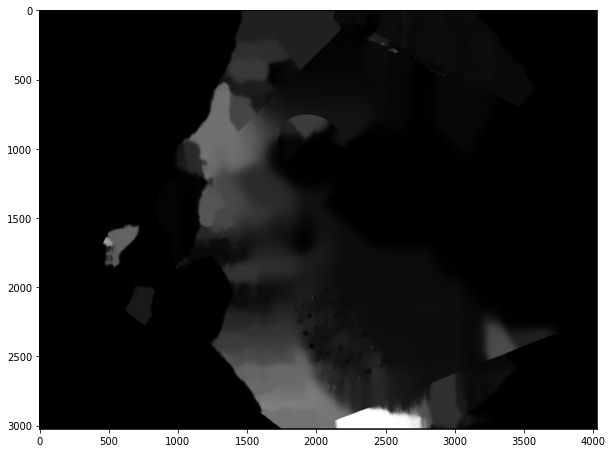

In [ ]:
wsize = 11
max_disp = 128
sigma = 1.5
lmbda = 8000.0
left_matcher = cv2.StereoBM_create(max_disp, wsize);
right_matcher = cv2.ximgproc.createRightMatcher(left_matcher);
left_disp = left_matcher.compute(gray1_warp, gray2_warp);
right_disp = right_matcher.compute(gray2_warp, gray1_warp);

# Now create DisparityWLSFilter
wls_filter = cv2.ximgproc.createDisparityWLSFilter(left_matcher);
wls_filter.setLambda(lmbda);
wls_filter.setSigmaColor(sigma);
filtered_disp = wls_filter.filter(left_disp, gray1_warp, disparity_map_right=right_disp);
plt.figure(figsize=(10,10))
plt.imshow(filtered_disp,'gray')

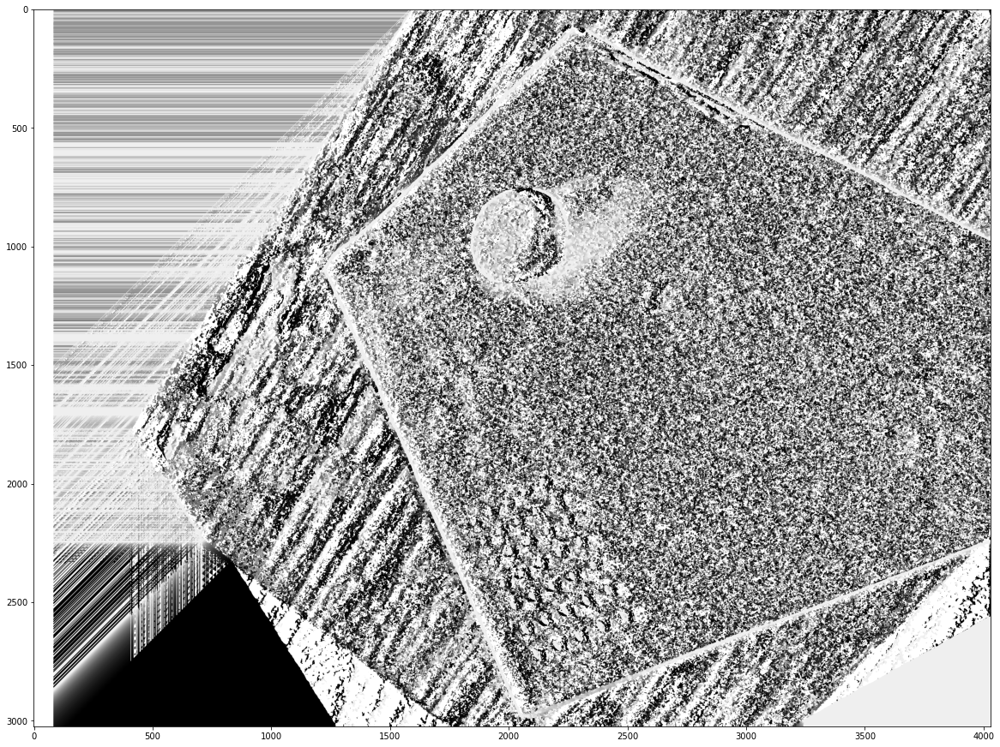

In [ ]:
depth_map = 1/disparity
plt.figure(figsize=(20,20))
plt.imshow(depth_map,'gray')

In [ ]:
reproj = cv2.reprojectImageTo3D(disparity)
plt.imshow(reproj)

TypeError: ignored

In [ ]:
ret1, corners1 = cv2.findCirclesGrid(gray1_warp, shape, flags = cv2.CALIB_CB_SYMMETRIC_GRID + cv2.CALIB_CB_CLUSTERING, blobDetector=detector)
ret2, corners2 = cv2.findCirclesGrid(gray2_warp, shape, flags = cv2.CALIB_CB_SYMMETRIC_GRID + cv2.CALIB_CB_CLUSTERING, blobDetector=detector)

#try aligning:
y_diff = 0.
for pt1, pt2 in zip(corners1, corners2):
  y_diff += pt2[0][1] - pt1[0][1]
y_diff /= len(corners1)
# imgL = cv2.warpAffine(gray1, warp_mat, (gray1_U.shape[1], gray1_U.shape[0]))
# imgR = gray2.copy()
print(y_diff)
print(len(corners1))
print(len(corners2))

# F would have changed(not sure)
stereocalibration_criteria = (cv2.TERM_CRITERIA_MAX_ITER + cv2.TERM_CRITERIA_EPS, 100, 1e-5)
stereocalibration_flags = cv2.CALIB_FIX_INTRINSIC
stereocalibration_retval, cameraMatrix1_U, distCoeffs1_U, cameraMatrix2_U, distCoeffs2_U, R, T, E, F = cv2.stereoCalibrate(
    objpoints, 
    [corners1],
    [corners2],
    cameraMatrix1,
    distCoeffs1,
    cameraMatrix2,
    distCoeffs2,
    gray1_U.shape[::-1],
    criteria = stereocalibration_criteria, 
    flags = stereocalibration_flags)
print("fundamental matrix:\n", F)

lines1 = cv2.computeCorrespondEpilines(corners2.reshape(-1,1,2), 2, F)
lines1 = lines1.reshape(-1,3)
img5,img6 = drawlines(gray1_U,gray2_U,lines1,corners1,corners2,colors)
# Find epilines corresponding to points in left image (first image) and
# drawing its lines on right image
lines2 = cv2.computeCorrespondEpilines(corners1 .reshape(-1,1,2), 1, F)
lines2 = lines2.reshape(-1,3)
img3,img4 = drawlines(gray2_U, gray1_U, lines2, corners2, corners1, colors)

fig, ax = plt.subplots(1,2,figsize=(24,20))
ax[0].imshow(img5)
ax[1].imshow(img3)

-6.9899832589285715
35
35


NameError: ignored

## Get P1 and P2 from estimated motion

In [ ]:
# get rotation matrix from rodrigues vector
# R = np.zeros((3,3))
# cv2.Rodrigues(R_vec, R)
print(R)
print(T)
# P1 = np.dot(mtx, np.concatenate((R, T_vec), axis=1))
P1 = np.dot(mtx, np.concatenate((np.identity(3), np.zeros((3,1))), axis=1))
P2 = np.dot(mtx, np.concatenate((R, T), axis=1))
print("===================")
print("Projection matrices")
print(P1)
print(P2)

[[ 0.97428824  0.02656397 -0.22373371]
 [-0.00505019  0.99535054  0.09618629]
 [ 0.22524856 -0.09258328  0.96989248]]
[[-4.17866387]
 [-1.01158653]
 [-0.97808613]]
Projection matrices
[[3.09780121e+03 0.00000000e+00 1.52093983e+03 0.00000000e+00]
 [0.00000000e+00 3.07872932e+03 2.01415026e+03 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 1.00000000e+00 0.00000000e+00]]
[[ 3.36074081e+03 -5.85236972e+01  7.82065549e+02 -1.44322802e+04]
 [ 4.38136259e+02  2.87793826e+03  2.24964075e+03 -5.08441354e+03]
 [ 2.25248557e-01 -9.25832764e-02  9.69892481e-01 -9.78086132e-01]]


In [ ]:
# Try warping with these P1 and P2
ret1, corners1 = cv2.findCirclesGrid(gray1, shape, flags = cv2.CALIB_CB_SYMMETRIC_GRID + cv2.CALIB_CB_CLUSTERING, blobDetector=detector)
ret2, corners2 = cv2.findCirclesGrid(gray2, shape, flags = cv2.CALIB_CB_SYMMETRIC_GRID + cv2.CALIB_CB_CLUSTERING, blobDetector=detector)

points4D = cv2.triangulatePoints(P1, P2, corners1, corners2)
# print(points4D)

points3D = []
for x, y, z, w in zip(points4D[0], points4D[1], points4D[2], points4D[3]):
  points3D.append(cv2.convertPointsFromHomogeneous(np.mat([x, y, z, w], dtype=np.float32)))

# print(points3D)

dist1 = np.linalg.norm(points3D[1]-points3D[0])
dist2 = np.linalg.norm(points3D[2]-points3D[1])
dist3 = np.linalg.norm(points3D[3]-points3D[2])
dist4 = np.linalg.norm(points3D[4]-points3D[3])
dist5 = np.linalg.norm(points3D[5]-points3D[4])
dist6 = np.linalg.norm(points3D[6]-points3D[5])
print(dist1, dist2, dist3, dist4, dist5, dist6)

0.97146124 0.99296665 0.99885404 0.99454224 0.9888637 0.9972032


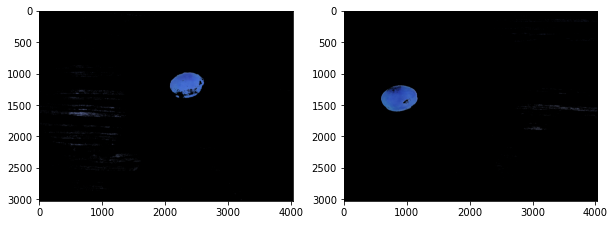

In [ ]:
# color mask
lower_red = np.array([0,0,150])
upper_red = np.array([120,120,250])
mask1 = cv2.inRange(img1, lower_red, upper_red)
mask2 = cv2.inRange(img2, lower_red, upper_red)

# set my output img to zero everywhere except my mask
out1 = img1.copy()
out1[np.where(mask1==0)] = 0
out2 = img2.copy()
out2[np.where(mask2==0)] = 0
# plt.imshow(out2, "gray")
fig, ax = plt.subplots(1, 2, figsize=(10,10))
ax[0].imshow(out1)
ax[1].imshow(out2)

# blurred1 = cv2.GaussianBlur(out1, (31, 31), 0)
# thresh1 = cv2.threshold(blurred1, 0, 255, cv2.THRESH_BINARY )[1]
# blurred2 = cv2.GaussianBlur(out2, (31, 31), 0)
# thresh2 = cv2.threshold(blurred2, 0, 255, cv2.THRESH_BINARY )[1]

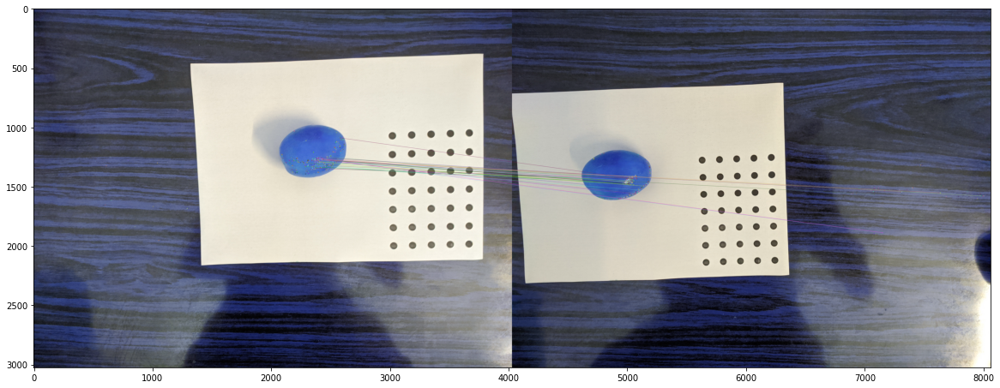

In [ ]:

orb = cv2.ORB_create()
queryKeypoints, queryDescriptors = orb.detectAndCompute(out1,None)
trainKeypoints, trainDescriptors = orb.detectAndCompute(out2,None)
matcher = cv2.BFMatcher()
matches = matcher.match(queryDescriptors,trainDescriptors)

final_img = cv2.drawMatches(img1, queryKeypoints, 
img2, trainKeypoints, matches[:30] ,None)

plt.figure(figsize = (20,20))
plt.imshow(final_img)

In [ ]:
pts1 = np.array([[q.pt] for q in queryKeypoints[:5]])
pts2 = np.array([[t.pt] for t in trainKeypoints[:5]])
# print(pts1)
# print(corners1)
points4D = cv2.triangulatePoints(P1, P2, pts1, pts2)

points3D = []
for x, y, z, w in zip(points4D[0], points4D[1], points4D[2], points4D[3]):
  points3D.append(cv2.convertPointsFromHomogeneous(np.mat([x, y, z, w], dtype=np.float32)))

points3D = [pt.squeeze() for pt in points3D]
# print(points3D)
x = np.mean([p[0] for p in points3D])
y = np.mean([p[1] for p in points3D])
z = np.mean([p[2] for p in points3D])
mean_dist = np.sqrt(x**2 + y**2 + z**2)
print(mean_dist*1.5 , "cm")

55.541412604983535 cm


# FINAL PIPELINE
TODO: need to fix the object detection step in section 2. Getting non-tomato regions as well

## 1. Preprocessing
Get camera intrinsic parameters through camera calibration

In [ ]:
import glob
import numpy as np
import cv2 as cv2
from matplotlib import pyplot as plt

In [ ]:
params = cv2.SimpleBlobDetector_Params()
# Setup SimpleBlobDetector parameters.
print('params')
print(params)
print(type(params))

params.filterByArea = True
params.minArea = 500
params.maxArea = 6000
params.minDistBetweenBlobs = 15
params.filterByColor = True
params.filterByConvexity = False
params.minCircularity = 0.4
params.filterByCircularity = True
# Filter by Inertia
params.filterByInertia = True
# params.filterByInertia = False
params.minInertiaRatio = 0.01

detector = cv2.SimpleBlobDetector_create(params)


params
<SimpleBlobDetector_Params 0x7f1a58af18d0>
<class 'cv2.SimpleBlobDetector_Params'>


In [ ]:
shape = (7, 5)
# list of known 3d points used as a reference
objp = np.zeros((7*5, 3), dtype=np.float32)
objp[:,:2] = np.mgrid[0:7,0:5].T.reshape(-1,2)
# Arrays to store object points and image points from all the images.
objpoints = [] # 3d point in real world space
imgpoints = [] # 2d points in image plane.

images = glob.glob("sample*.jpg")
for fname in images:
  img = cv2.imread(fname)
  gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

  ret, corners = cv2.findCirclesGrid(gray, shape, flags = cv2.CALIB_CB_SYMMETRIC_GRID + cv2.CALIB_CB_CLUSTERING, blobDetector=detector)
  if ret == True:
    objpoints.append(objp)
    imgpoints.append(corners)
    print(f"added points from image:{fname}")


added points from image:sample7.jpg
added points from image:sample8.jpg
added points from image:sample1.jpg
added points from image:sample4.jpg
added points from image:sample3.jpg
added points from image:sample9.jpg
added points from image:sample6.jpg
added points from image:sample5.jpg
added points from image:sample2.jpg
added points from image:sample0.jpg


In [ ]:
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, gray.shape[::-1], None, None)
# print("ret", ret)
print("camera matrix from callibration\n", mtx)
print("distortion coeffs", dist[0])
# print("extrinsic params\n", rvecs, tvecs)

camera matrix from callibration
 [[3.22449253e+03 0.00000000e+00 1.96287885e+03]
 [0.00000000e+00 3.23176728e+03 1.49836022e+03]
 [0.00000000e+00 0.00000000e+00 1.00000000e+00]]
distortion coeffs [ 0.3759111  -1.28376375  0.00277973 -0.00687517  1.55936805]


## Wrap everything(SFM)
use intrinsic parameters(from previous section) to estimate the size of the object

In [ ]:
import imutils
import math
class SFM:

    def __init__(self):
        # intrinsic camera parameters. get them by camera calibration or using image metadata
        #(parameters of my phone's camera)
        f = 4.2e-3 # 4.2 mm
        dx = dy = 1.4e-6  #1.4µm
        x0 = 2016
        y0 = 1512
        self.alpha = f / dx # focal length in terms of pixels
        # camera matrix
        self.K = np.mat([[f/dx, 0,    x0],
                        [0,    f/dy, y0], 
                        [0,    0,    1 ]])
        #distortion coefficients
        self.dist = np.mat([[0,0,0,0,0]])

    def findGrid(self, gray1, gray2):
        '''
            findGrid() finds the grid(reference pattern) in two images. returns the detected 
            corners in the two images and the corresponding 3D points
        '''
        shape = (7, 5) # grid size
        # list of known 3d points used as a reference
        objp = np.zeros((7*5, 3), dtype=np.float32)
        objp[:,:2] = np.mgrid[0:7,0:5].T.reshape(-1,2)

        ret1, corners1 = cv2.findCirclesGrid(gray1, shape, flags = cv2.CALIB_CB_SYMMETRIC_GRID + cv2.CALIB_CB_CLUSTERING, blobDetector=detector)
        ret2, corners2 = cv2.findCirclesGrid(gray2, shape, flags = cv2.CALIB_CB_SYMMETRIC_GRID + cv2.CALIB_CB_CLUSTERING, blobDetector=detector)
        assert ret1 and ret2, "could not find the grid in one of the images."
        return corners1, corners2, objp

    def getDepth(self, img1, img2, gray1, gray2, scale):

        # 1. Rotation and Translation matrices between cameras
        corners1, corners2, objp = self.findGrid(gray1, gray2)
        stereocalibration_criteria = (cv2.TERM_CRITERIA_MAX_ITER + cv2.TERM_CRITERIA_EPS, 100, 1e-5)
        stereocalibration_flags = cv2.CALIB_FIX_INTRINSIC
        stereocalibration_retval, cameraMatrix1, distCoeffs1, cameraMatrix2, distCoeffs2, R, T, E, F = cv2.stereoCalibrate(
            [objp], 
            [corners1],
            [corners2],
            mtx,
            dist,
            mtx,
            dist,
            gray1.shape[::-1],
            criteria = stereocalibration_criteria, 
            flags = stereocalibration_flags)
        print("============================================================")
        print("translation and rotation between the two camera positions:")
        print("Translation:\n", T)
        print("Rotation:\n", R)

        # 2. P1 and P2 from estimated motion
        P1 = np.dot(self.K, np.concatenate((np.identity(3), np.zeros((3,1))), axis=1))
        P2 = np.dot(self.K, np.concatenate((R, T), axis=1))

        # 3. object detection
        lower_red = np.array([0,0,150])
        upper_red = np.array([120,120,250])
        mask1 = cv2.inRange(img1, lower_red, upper_red)
        mask2 = cv2.inRange(img2, lower_red, upper_red)
        # set output img to zero everywhere except mask
        out1 = img1.copy()
        out1[np.where(mask1==0)] = 0
        out2 = img2.copy()
        out2[np.where(mask2==0)] = 0

        # 4. match features
        orb = cv2.ORB_create()
        queryKeypoints, queryDescriptors = orb.detectAndCompute(out1, None)
        trainKeypoints, trainDescriptors = orb.detectAndCompute(out2, None)
        matcher = cv2.BFMatcher()
        matches = matcher.match(queryDescriptors[:5],trainDescriptors[:5])
        final_img = cv2.drawMatches(img1, queryKeypoints, img2, trainKeypoints, matches[:5] ,None)
        plt.figure(figsize=(20,20))
        plt.imshow(cv2.cvtColor(final_img, cv2.COLOR_BGR2RGB))
  
        # 5. get distance
        pts1 = np.array([[q.pt] for q in queryKeypoints[:]])
        pts2 = np.array([[t.pt] for t in trainKeypoints[:]])
        points4D = cv2.triangulatePoints(P1, P2, pts1, pts2)
        points3D = []
        for x, y, z, w in zip(points4D[0], points4D[1], points4D[2], points4D[3]):
            points3D.append(cv2.convertPointsFromHomogeneous(np.mat([x, y, z, w], dtype=np.float32)))

        points3D = [pt.squeeze() for pt in points3D]
        x = np.mean([p[0] for p in points3D])
        y = np.mean([p[1] for p in points3D])
        z = np.mean([p[2] for p in points3D])
        ## DONT NEED THE DISTANCE; NEED THE DEPTH
        # mean_dist = np.sqrt(x**2 + y**2 + z**2) * scale # mean distance of object in cm
        return z * scale


    def Measure(self, img1, img2, gray1, gray2, scale=1.5):
        '''
            getSize() takes two images and returns the real world size of the object along with the sorrounding ellipse
            scale = distance (in cm) between adjacent dots in the grid used for pattern matching
        '''

        depth = self.getDepth(img1, img2, gray1, gray2, scale)
        print(f"=============================")
        print(f"Object distance: {depth:0.3f} cm")

        print(f"================================")
        R, imgs = self.getObject(img1)
        radii = [] # radii in cm
        for r in R:
            r[0] = r[0]*depth/self.alpha
            r[1] = r[1]*depth/self.alpha
            radii.append(r)
            av_r = (r[0]+r[1]) / 2
            v = 4/3 * math.pi * av_r**3
            print(f"Radii of ellipse: {r}cm.\nAverage Radius of tomato: {av_r:0.3f}cm")
            # print(f"Estimated volutme: {v:0.3f}cm")
        return radii, imgs


    def getObject(self, img):
        '''
        getObject() takes in a single image and finds the object of interest 
        and returns the clean images and radius in pixels.

        '''
 
        #1. Color mask
        ###############
        lower_red = np.array([0,0,150])
        upper_red = np.array([120,120,250])
        mask = cv2.inRange(img, lower_red, upper_red)

        # set output img to zero everywhere except mask
        out = img.copy()
        out[np.where(mask==0)] = 0
        gray = cv2.cvtColor(out, cv2.COLOR_BGR2GRAY)
        #2. Gaussian blur to get smoother boundaries
        ############################################
        blurred = cv2.GaussianBlur(gray, (51, 51), 0)

        #3. Threshold and make image binary
        ###################################
        thresh = cv2.threshold(blurred, 0, 255, cv2.THRESH_BINARY )[1]

        #4. Remove any patches not roughly the size of a fruit
        ######################################################
        #find all your connected components (white blobs in your image)
        nb_components, output, stats, centroids = cv2.connectedComponentsWithStats(thresh, connectivity=8)
        #connectedComponentswithStats yields every seperated component with information on each of them, such as size
        #the following part is just taking out the background which is also considered a component, but most of the time we don't want that.
        sizes = stats[1:, -1]; nb_components = nb_components - 1

        # minimum size of particles we want to keep (number of pixels)
        min_size = 5e4
        max_size = 1e6

        clean_img = np.zeros((img.shape), dtype=np.uint8)
        
        #for every component in the image, you keep it only if it's in range: above min size and below max size
        for i in range(0, nb_components):
            if sizes[i] >= min_size and sizes[i] <= max_size:
                clean_img[output == i + 1] = 255

        #5. Edge detector
        #################
        edged = cv2.Canny(clean_img, 70, 100)

        #6. Find and draw contours on image
        ###################################
        cnts = cv2.findContours(edged.copy(), cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
        cnts = imutils.grab_contours(cnts)
        cnts = sorted(cnts, key = cv2.contourArea, reverse = True)[:10]

        tomatoes = []
        # loop over our contours
        for c in cnts:
            (x, y, w, h) = cv2.boundingRect(c)
            ar = w / float(h)
            # in order to label the contour as a question, region
            # should be sufficiently wide, sufficiently tall, and
            # have an aspect ratio approximately equal to 1
            # if w >= 20 and h >= 20 and ar >= 0.9 and ar <= 1.1:
            tomatoes.append(c)

        assert len(tomatoes) > 0, "Could not find any tomatoes! try changing some of the parameters"

        img_w_contours = img.copy()
        cv2.drawContours(img_w_contours, tomatoes, -1, (0, 255, 0), 20) 

        #7. estimate size of ellipses(instead of circles)
        #################################################
        img_w_ell = img.copy()
        color = [0,255,0]
        minRect = []
        minEllipse = []
        for i, c in enumerate(tomatoes):
            if c.shape[0] > 5:
                minRect.append(cv2.minAreaRect(c))
                minEllipse.append(cv2.fitEllipse(c))

        # sort according to minRect
        zippedLists = zip(minRect, minEllipse)
        zippedLists = sorted(zippedLists)
        minEllipse_sorted = [elem for _, elem in zippedLists]
        Radii = []
        # draw ellipse on image
        if len(minEllipse) > 0:
            eli = minEllipse[0]
            cv2.ellipse(img_w_ell, eli, color, 20)
            d1,d2 = eli[1]
            av_dia = sum(eli[1])/2
            # print(f"d1, d2(in mm) = ({d1*PX_to_MM:0.2f}, {d2*PX_to_MM:0.2f}), radius(in px) = {av_dia}, radius(in mm) = {av_dia * PX_to_MM:0.2f}")
            Radii.append([d1,d2])
        ## Done 
        return Radii, [out, thresh, clean_img, img_w_contours, img_w_ell]


translation and rotatation between the two camera positions:
Translation:
 [[7.16284517]
 [7.20515938]
 [6.96448676]]
Rotation:
 [[ 0.98178959  0.10522351 -0.15816829]
 [-0.13342754  0.97460296 -0.17985037]
 [ 0.1352268   0.19767923  0.97089476]]
Object distance: 52.060 cm
Radii of ellipse: [7.916512582300231, 8.83417197121773]cm.
Average Radius of tomato: 8.375cm


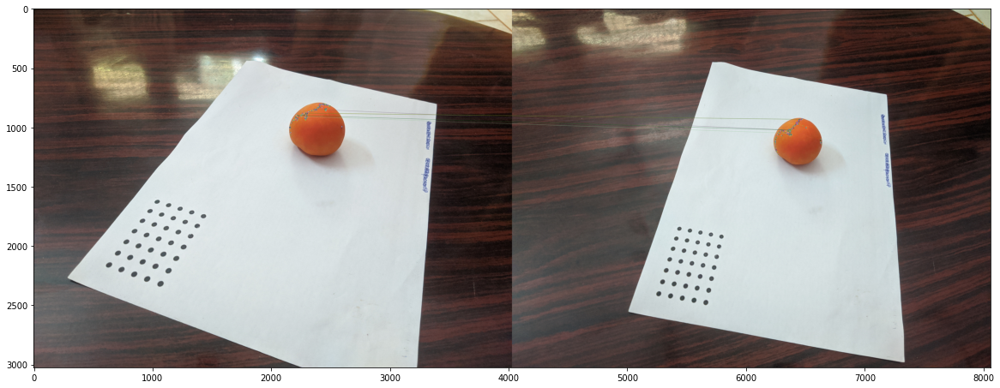

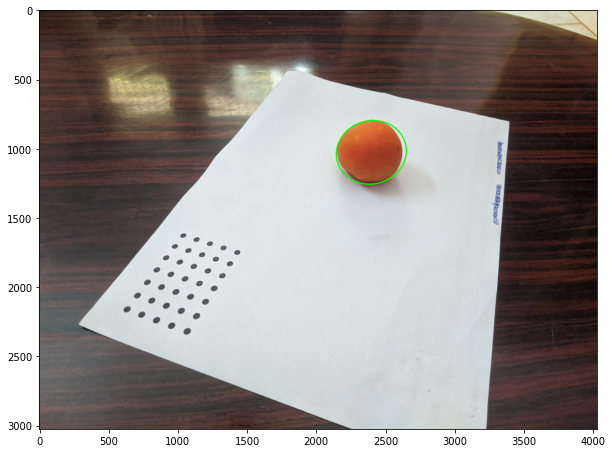

In [ ]:
sfm = SFM()
img1 = cv2.imread("tomato1.jpg")
img2 = cv2.imread("tomato2.jpg")
img3 = cv2.imread("tomato3.jpg")

gray1 = cv2.cvtColor(img1, cv2.COLOR_BGR2GRAY)
gray2 = cv2.cvtColor(img2, cv2.COLOR_BGR2GRAY)
gray3 = cv2.cvtColor(img3, cv2.COLOR_BGR2GRAY)

size, imgs = sfm.Measure(img1, img2, gray1, gray2)
plt.figure(figsize=(10,10))
plt.imshow(cv2.cvtColor(imgs[-1], cv2.COLOR_BGR2RGB));


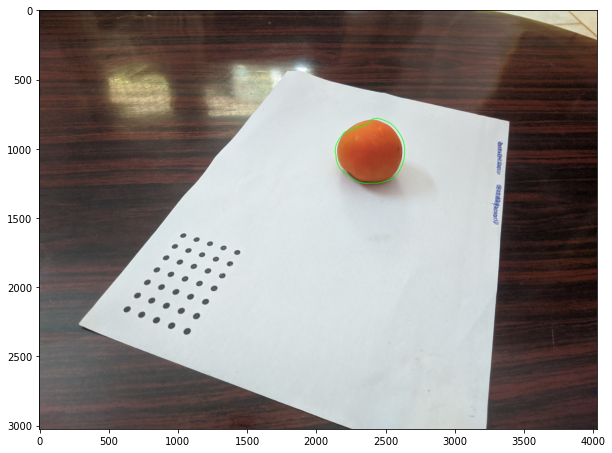

In [ ]:
plt.figure(figsize=(10,10))
plt.imshow(cv2.cvtColor(imgs[-2], cv2.COLOR_BGR2RGB));

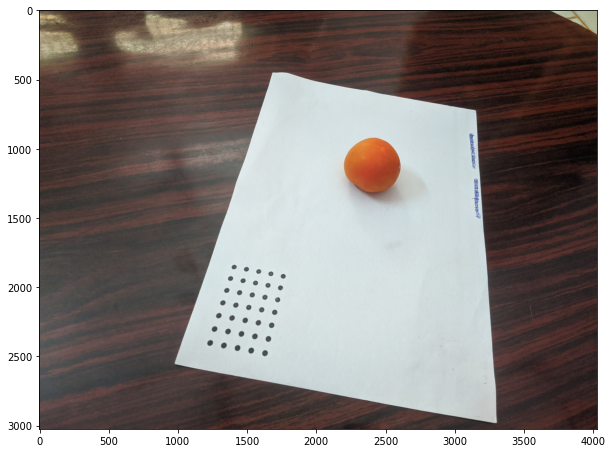

In [ ]:
plt.figure(figsize=(10,10))
plt.imshow(cv2.cvtColor(img2, cv2.COLOR_BGR2RGB))

translation and rotatation between the two camera positions:
Translation:
 [[-12.05384105]
 [ -1.85504402]
 [  1.15838728]]
Rotation:
 [[ 0.97274684 -0.19828505  0.12019415]
 [ 0.20003584  0.97978524 -0.00255808]
 [-0.11725722  0.0265315   0.99274711]]
Object distance: 58.431 cm
Radii of ellipse: [7.805925944283837, 8.54991060648556]cm.
Average Radius of tomato: 8.178cm


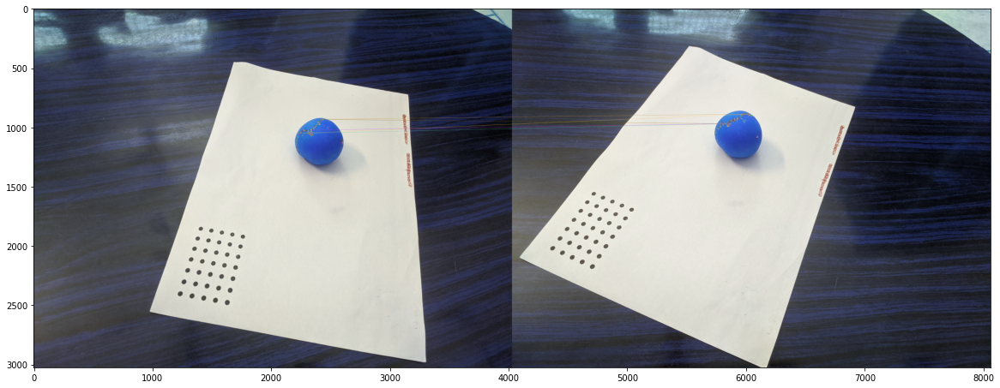

In [ ]:
sfm.Measure(img2, img3, gray2, gray3);

In [ ]:
sfm.Measure(img1, img3, gray1, gray3);

translation and rotatation between the two camera positions:
Translation:
 [[-6.01455439]
 [ 6.49968603]
 [ 6.8447662 ]]
Rotation:
 [[ 0.99742458 -0.071485    0.00583955]
 [ 0.07105164  0.97369152 -0.21650977]
 [ 0.00979128  0.21636707  0.97626299]]
Object distance: 52.544 cm
Average Radius of tomato: 8.225. Estimated Volume = 2330.892 cc


In [ ]:
imgs = []
for i in range(len(imgs)):
    for j in range(i+1, len(imgs)):
        